In [1]:
import sys
import os
from glob import glob
sys.path.append("../NEAT")
from NEATModels import NEATStatic, nets
from NEATModels.Staticconfig  import static_config
from NEATUtils import helpers
from NEATUtils.helpers import save_json, load_json
os.environ["CUDA_VISIBLE_DEVICES"]="0"
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

Using TensorFlow backend.


In [2]:
npz_directory = '/home/sancere/Kepler/CurieTrainingDatasets/Dalmiro_Laura/LandmarkData/'
npz_name = 'Landmark128.npz'
npz_val_name = 'Landmark128Val.npz'


model_dir = '/home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/'
#Model name based on wether it is residual or sequntial ONEAT network
model_name = 'Landmark128K7.h5'


In [3]:
static_categories_json = model_dir + 'StaticCategories.json'
key_categories = load_json(static_categories_json)
static_cord_json = model_dir + 'StaticCord.json'
key_cord = load_json(static_cord_json)

#For ORNET use residual = True and for OSNET use residual = False
residual = False
#NUmber of starting convolutional filters, is doubled down with increasing depth
startfilter = 16
#CNN network start layer, mid layers and lstm layer kernel size
start_kernel = 7
mid_kernel = 7
#Network depth has to be 9n + 2, n= 3 or 4 is optimal for Notum dataset
depth = 29
#Size of the gradient descent length vector, start small and use callbacks to get smaller when reaching the minima
learning_rate = 1.0E-6
#For stochastic gradient decent, the batch size used for computing the gradients
batch_size = 10
# use softmax for single event per box, sigmoid for multi event per box
multievent = False
# Trainng image size
yolo_v0 = True
show = True
#Training epochs, longer the better with proper chosen learning rate
epochs = 250
nboxes = 1
#The inbuilt model stride which is equal to the nulber of times image was downsampled by the network
stride = 4
show = True
imagex = 128
imagey = 128

In [4]:
config = static_config(npz_directory =npz_directory, npz_name = npz_name, npz_val_name = npz_val_name, 
                         key_categories = key_categories, key_cord = key_cord, 
                         residual = residual, depth = depth, start_kernel = start_kernel, stride = stride, mid_kernel = mid_kernel,
                         startfiler = startfilter, nboxes = nboxes, gridx = 1, gridy = 1, show = show,
                         epochs = epochs, learning_rate = learning_rate, imagex = imagex, imagey = imagey,
                         batch_size = batch_size, model_name = model_name, yolo_v0 = yolo_v0, multievent = multievent)

config_json = config.to_json()

print(config)
save_json(config_json, model_dir + os.path.splitext(model_name)[0] + '_Parameter.json')

static_config(batch_size=10, box_vector=2, categories=2, depth=29, epochs=250, gridx=1, gridy=1, imagex=128, imagey=128, key_categories={'Background': 0, 'Landmark': 1}, key_cord={'x': 0, 'y': 1}, learning_rate=1e-06, mid_kernel=7, model_name='Landmark128K7.h5', multievent=False, nboxes=1, npz_directory='/home/sancere/Kepler/CurieTrainingDatasets/Dalmiro_Laura/LandmarkData/', npz_name='Landmark128.npz', npz_val_name='Landmark128Val.npz', residual=False, show=True, start_kernel=7, startfilter=32, stride=(4,), yolo_v0=True)


number of  images:	 2656
image size (2D):		 (128, 128)
axes:				 SXYC
channels in / out:		 1
number of  images:	 140
image size (2D):		 (128, 128)
axes:				 SXYC
channels in / out:		 1
(2656, 1, 1, 4) 1
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 1 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 1600        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 128         conv2d_1[0][0]                   
______


Train on 2656 samples, validate on 140 samples
Epoch 1/250
2656/2656 [==============================] - 38s 14ms/step - loss: 0.7430 - accuracy: 0.7790 - val_loss: 0.6432 - val_accuracy: 0.8929

Epoch 00001: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6431750144277301, 'val_accuracy': 0.8928571343421936, 'loss': 0.7430278702852238, 'accuracy': 0.778991, 'lr': 1e-06}


<Figure size 432x288 with 0 Axes>

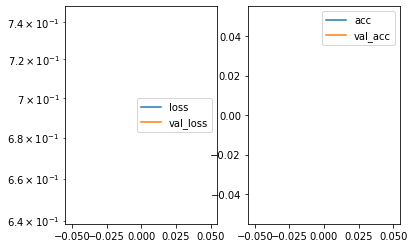

Predicted cell: Landmark Probability: [[0.9026704]]
True Cell type: Landmark
x [[0.3938191]]
True positional value x 0.421875
y [[0.45911342]]
True positional value y 0.421875


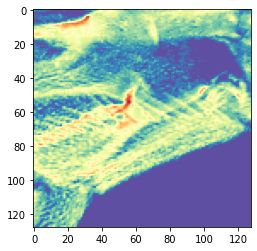

Epoch 2/250
2656/2656 [==============================] - 31s 12ms/step - loss: 0.6116 - accuracy: 0.8908 - val_loss: 0.6644 - val_accuracy: 0.8643

Epoch 00002: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6643860169819423, 'val_accuracy': 0.8642857074737549, 'loss': 0.6115744608532951, 'accuracy': 0.89081323, 'lr': 1e-06}


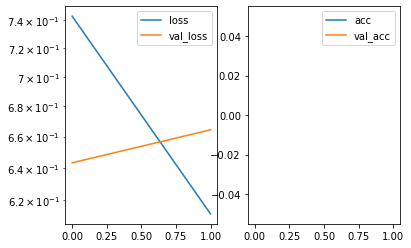

Predicted cell: Landmark Probability: [[0.8405945]]
True Cell type: Landmark
x [[0.8321917]]
True positional value x 0.5
y [[0.41245204]]
True positional value y 0.5


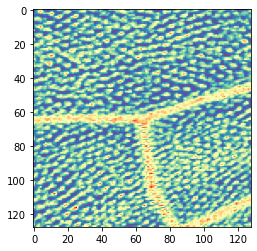

Epoch 3/250
2656/2656 [==============================] - 31s 12ms/step - loss: 0.5661 - accuracy: 0.8927 - val_loss: 0.6569 - val_accuracy: 0.8786

Epoch 00003: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6569494498627526, 'val_accuracy': 0.8785714507102966, 'loss': 0.5661388676254505, 'accuracy': 0.8926958, 'lr': 1e-06}


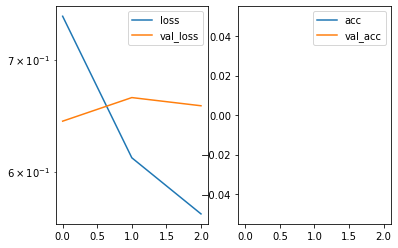

Predicted cell: Landmark Probability: [[0.8683397]]
True Cell type: Landmark
x [[0.8092232]]
True positional value x 0.5
y [[0.6568136]]
True positional value y 0.5


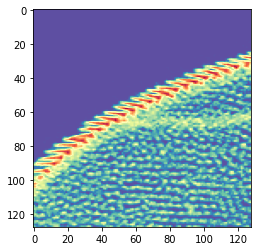

Epoch 4/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.5341 - accuracy: 0.8976 - val_loss: 0.6460 - val_accuracy: 0.8786

Epoch 00004: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6459840301956449, 'val_accuracy': 0.8785714507102966, 'loss': 0.534059330147792, 'accuracy': 0.89759034, 'lr': 1e-06}


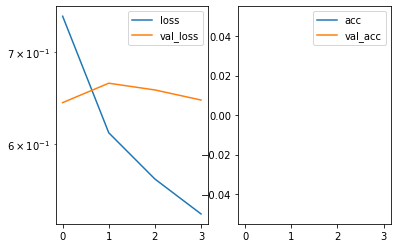

Predicted cell: Landmark Probability: [[0.95913565]]
True Cell type: Landmark
x [[0.59639734]]
True positional value x 0.578125
y [[0.5269311]]
True positional value y 0.578125


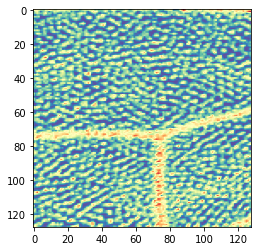

Epoch 5/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.4989 - accuracy: 0.9040 - val_loss: 0.6379 - val_accuracy: 0.8786

Epoch 00005: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6378915671791349, 'val_accuracy': 0.8785714507102966, 'loss': 0.4988542696214225, 'accuracy': 0.903991, 'lr': 1e-06}


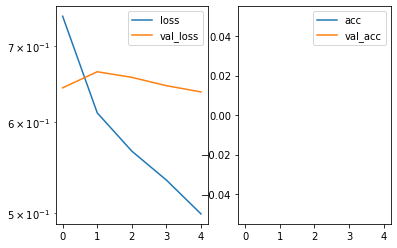

Predicted cell: Landmark Probability: [[0.86161697]]
True Cell type: Background
x [[0.4373836]]
True positional value x 0.5
y [[0.46730235]]
True positional value y 0.5


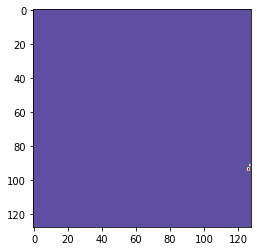

Epoch 6/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.4694 - accuracy: 0.9104 - val_loss: 0.6319 - val_accuracy: 0.8857

Epoch 00006: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6318525693246296, 'val_accuracy': 0.8857142925262451, 'loss': 0.4694093808038048, 'accuracy': 0.91039157, 'lr': 1e-06}


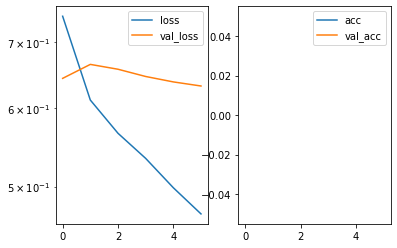

Predicted cell: Landmark Probability: [[0.70246]]
True Cell type: Landmark
x [[0.41403225]]
True positional value x 0.421875
y [[0.40405467]]
True positional value y 0.578125


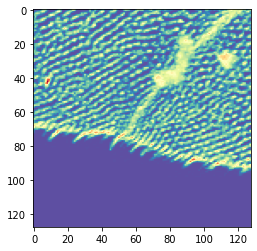

Epoch 7/250
2656/2656 [==============================] - 31s 12ms/step - loss: 0.4466 - accuracy: 0.9168 - val_loss: 0.6234 - val_accuracy: 0.8786

Epoch 00007: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6233741747481483, 'val_accuracy': 0.8785714507102966, 'loss': 0.4465809986444123, 'accuracy': 0.91679215, 'lr': 1e-06}


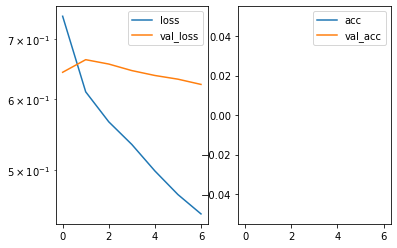

Predicted cell: Landmark Probability: [[0.92738825]]
True Cell type: Landmark
x [[0.5590126]]
True positional value x 0.578125
y [[0.35535663]]
True positional value y 0.5


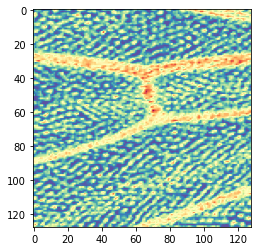

Epoch 8/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.4267 - accuracy: 0.9307 - val_loss: 0.6220 - val_accuracy: 0.8857

Epoch 00008: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6220080575772694, 'val_accuracy': 0.8857142925262451, 'loss': 0.42667084674249933, 'accuracy': 0.9307229, 'lr': 1e-06}


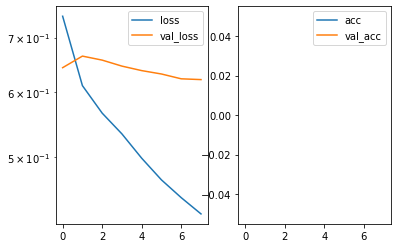

Predicted cell: Landmark Probability: [[0.92658585]]
True Cell type: Landmark
x [[0.71883196]]
True positional value x 0.578125
y [[0.7473238]]
True positional value y 0.421875


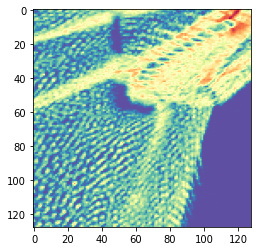

Epoch 9/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.4071 - accuracy: 0.9401 - val_loss: 0.6227 - val_accuracy: 0.8857

Epoch 00009: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6227029263973236, 'val_accuracy': 0.8857142925262451, 'loss': 0.40708125521799166, 'accuracy': 0.94013554, 'lr': 1e-06}


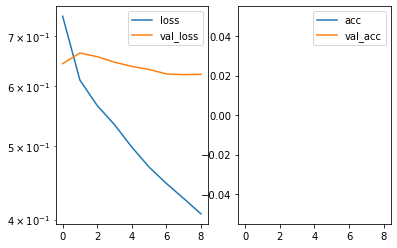

Predicted cell: Landmark Probability: [[0.51759195]]
True Cell type: Landmark
x [[0.6393142]]
True positional value x 0.578125
y [[0.3513519]]
True positional value y 0.421875


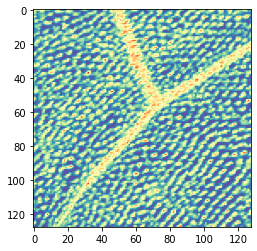

Epoch 10/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.3925 - accuracy: 0.9435 - val_loss: 0.6174 - val_accuracy: 0.8929

Epoch 00010: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6174497050898415, 'val_accuracy': 0.8928571343421936, 'loss': 0.39253925502928627, 'accuracy': 0.9435241, 'lr': 1e-06}


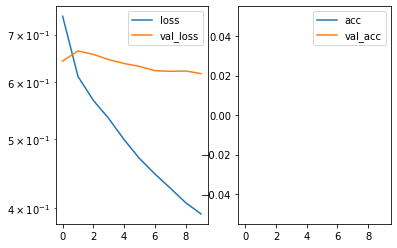

Predicted cell: Landmark Probability: [[0.9503101]]
True Cell type: Landmark
x [[0.4154424]]
True positional value x 0.578125
y [[0.24754223]]
True positional value y 0.5


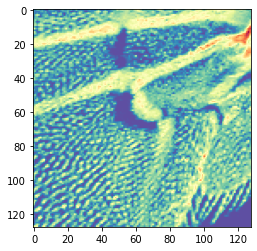

Epoch 11/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.3786 - accuracy: 0.9556 - val_loss: 0.6161 - val_accuracy: 0.8929

Epoch 00011: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6161180479185921, 'val_accuracy': 0.8928571343421936, 'loss': 0.3785957373364503, 'accuracy': 0.9555723, 'lr': 1e-06}


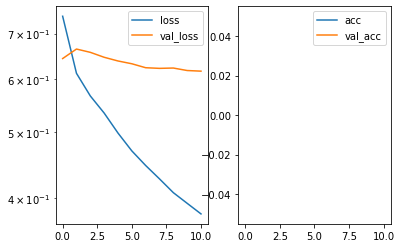

Predicted cell: Landmark Probability: [[0.8629113]]
True Cell type: Background
x [[0.43175635]]
True positional value x 0.5
y [[0.46463573]]
True positional value y 0.5


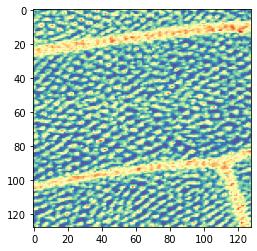

Epoch 12/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.3695 - accuracy: 0.9691 - val_loss: 0.6249 - val_accuracy: 0.8929

Epoch 00012: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6249177200453622, 'val_accuracy': 0.8928571343421936, 'loss': 0.3695326618491167, 'accuracy': 0.9691265, 'lr': 1e-06}


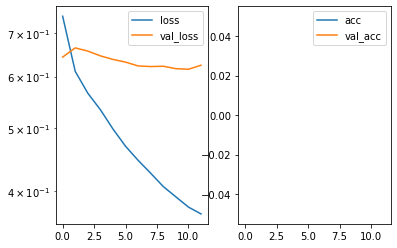

Predicted cell: Landmark Probability: [[0.9689066]]
True Cell type: Landmark
x [[0.46728668]]
True positional value x 0.421875
y [[0.35210526]]
True positional value y 0.421875


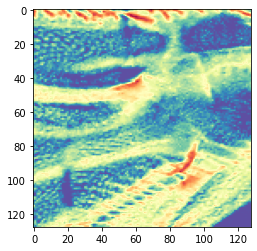

Epoch 13/250
2656/2656 [==============================] - 31s 12ms/step - loss: 0.3581 - accuracy: 0.9714 - val_loss: 0.6197 - val_accuracy: 0.8929

Epoch 00013: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.619731890303748, 'val_accuracy': 0.8928571343421936, 'loss': 0.3580845436642328, 'accuracy': 0.97138554, 'lr': 1e-06}


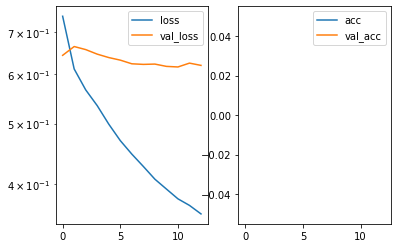

Predicted cell: Landmark Probability: [[0.98197776]]
True Cell type: Landmark
x [[0.72619605]]
True positional value x 0.421875
y [[0.6280521]]
True positional value y 0.5


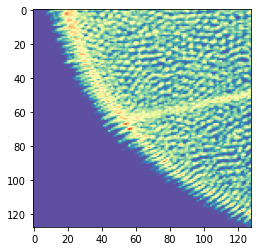

Epoch 14/250
2656/2656 [==============================] - 31s 12ms/step - loss: 0.3492 - accuracy: 0.9744 - val_loss: 0.6132 - val_accuracy: 0.9000

Epoch 00014: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6131722927093506, 'val_accuracy': 0.8999999761581421, 'loss': 0.3492393465376044, 'accuracy': 0.9743976, 'lr': 1e-06}


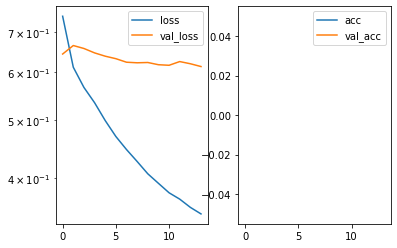

Predicted cell: Landmark Probability: [[0.9488776]]
True Cell type: Landmark
x [[0.58359575]]
True positional value x 0.5
y [[0.54216796]]
True positional value y 0.421875


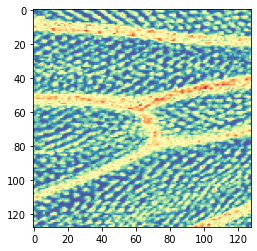

Epoch 15/250
2656/2656 [==============================] - 31s 12ms/step - loss: 0.3389 - accuracy: 0.9842 - val_loss: 0.6176 - val_accuracy: 0.8929

Epoch 00015: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6176315886633736, 'val_accuracy': 0.8928571343421936, 'loss': 0.3389433889638588, 'accuracy': 0.98418677, 'lr': 1e-06}


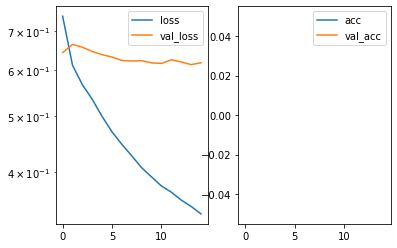

Predicted cell: Landmark Probability: [[0.9353091]]
True Cell type: Landmark
x [[0.22509557]]
True positional value x 0.5
y [[0.609589]]
True positional value y 0.421875


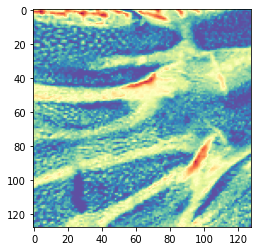

Epoch 16/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.3332 - accuracy: 0.9872 - val_loss: 0.6237 - val_accuracy: 0.9000

Epoch 00016: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6236576821122851, 'val_accuracy': 0.8999999761581421, 'loss': 0.33318081056048354, 'accuracy': 0.98719877, 'lr': 1e-06}


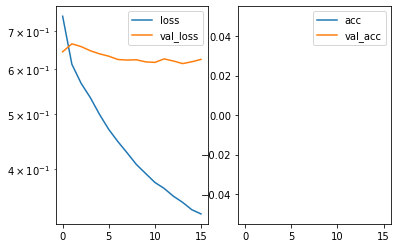

Predicted cell: Landmark Probability: [[0.98641264]]
True Cell type: Landmark
x [[0.5353958]]
True positional value x 0.5
y [[0.55531526]]
True positional value y 0.421875


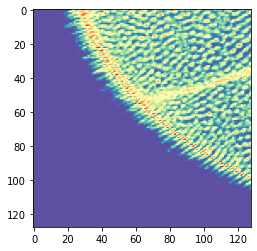

Epoch 17/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.3267 - accuracy: 0.9891 - val_loss: 0.6254 - val_accuracy: 0.9000

Epoch 00017: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6253923922777176, 'val_accuracy': 0.8999999761581421, 'loss': 0.326679187703384, 'accuracy': 0.9890813, 'lr': 1e-06}


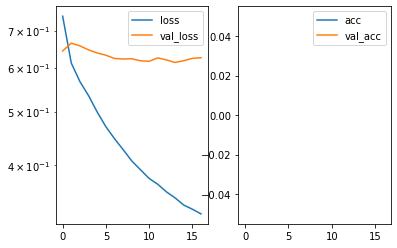

Predicted cell: Landmark Probability: [[0.9922707]]
True Cell type: Landmark
x [[0.45483425]]
True positional value x 0.5
y [[0.5186928]]
True positional value y 0.578125


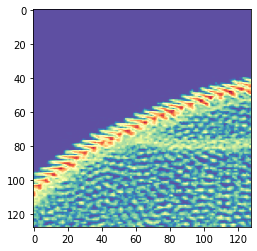

Epoch 18/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.3237 - accuracy: 0.9887 - val_loss: 0.6176 - val_accuracy: 0.9000

Epoch 00018: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.617554743375097, 'val_accuracy': 0.8999999761581421, 'loss': 0.3237134167049305, 'accuracy': 0.9887048, 'lr': 1e-06}


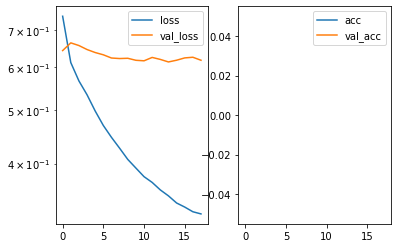

Predicted cell: Landmark Probability: [[0.9899629]]
True Cell type: Landmark
x [[0.34294152]]
True positional value x 0.5781249999999998
y [[0.27934882]]
True positional value y 0.421875


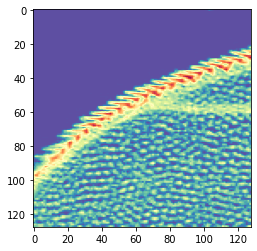

Epoch 19/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.3182 - accuracy: 0.9932 - val_loss: 0.6200 - val_accuracy: 0.9000

Epoch 00019: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6200290002993175, 'val_accuracy': 0.8999999761581421, 'loss': 0.3182206415762025, 'accuracy': 0.9932229, 'lr': 1e-06}


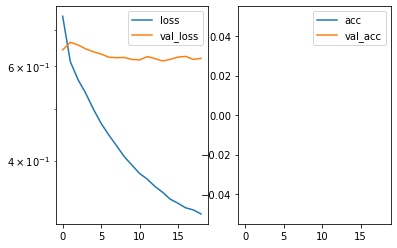

Predicted cell: Landmark Probability: [[0.97150797]]
True Cell type: Landmark
x [[0.56650037]]
True positional value x 0.578125
y [[0.47574437]]
True positional value y 0.421875


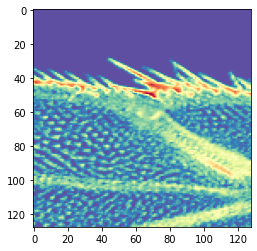

Epoch 20/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.3147 - accuracy: 0.9959 - val_loss: 0.6310 - val_accuracy: 0.8929

Epoch 00020: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.631001176578658, 'val_accuracy': 0.8928571343421936, 'loss': 0.3147253974239869, 'accuracy': 0.99585843, 'lr': 1e-06}


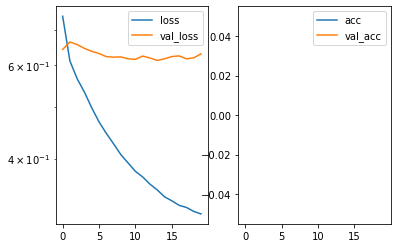

Predicted cell: Landmark Probability: [[0.9753922]]
True Cell type: Landmark
x [[0.7425747]]
True positional value x 0.5
y [[0.7114507]]
True positional value y 0.5


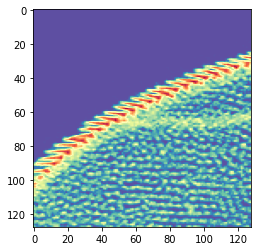

Epoch 21/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.3102 - accuracy: 0.9962 - val_loss: 0.6283 - val_accuracy: 0.9000

Epoch 00021: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6282789962632316, 'val_accuracy': 0.8999999761581421, 'loss': 0.3102198018726096, 'accuracy': 0.99623495, 'lr': 1e-06}


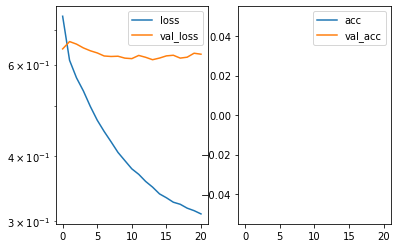

Predicted cell: Landmark Probability: [[0.98612285]]
True Cell type: Landmark
x [[0.7902808]]
True positional value x 0.578125
y [[0.6952787]]
True positional value y 0.5


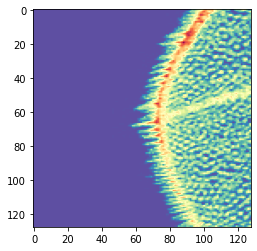

Epoch 22/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.3058 - accuracy: 0.9981 - val_loss: 0.6311 - val_accuracy: 0.9000

Epoch 00022: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6311481169291905, 'val_accuracy': 0.8999999761581421, 'loss': 0.30581699224211367, 'accuracy': 0.99811745, 'lr': 1e-06}


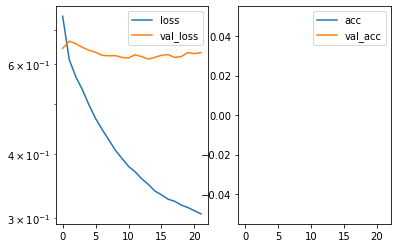

Predicted cell: Landmark Probability: [[0.9911487]]
True Cell type: Landmark
x [[0.2333524]]
True positional value x 0.5
y [[0.6499617]]
True positional value y 0.578125


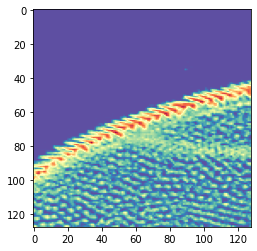

Epoch 23/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.3036 - accuracy: 0.9985 - val_loss: 0.6307 - val_accuracy: 0.9000

Epoch 00023: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6307472139596939, 'val_accuracy': 0.8999999761581421, 'loss': 0.3035943173545312, 'accuracy': 0.99849397, 'lr': 1e-06}


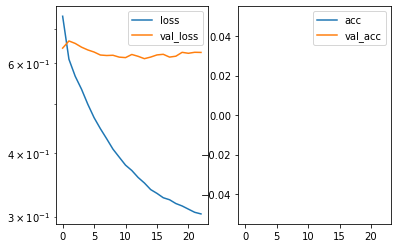

Predicted cell: Landmark Probability: [[0.97206205]]
True Cell type: Landmark
x [[0.31458372]]
True positional value x 0.578125
y [[0.3759138]]
True positional value y 0.578125


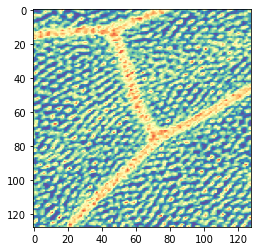

Epoch 24/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.3018 - accuracy: 0.9962 - val_loss: 0.6302 - val_accuracy: 0.9000

Epoch 00024: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.630215259534972, 'val_accuracy': 0.8999999761581421, 'loss': 0.301760047494647, 'accuracy': 0.99623495, 'lr': 1e-06}


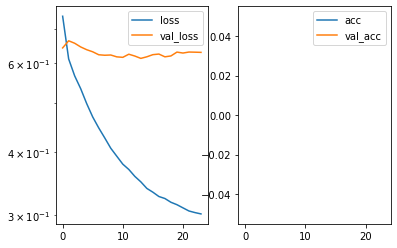

Predicted cell: Landmark Probability: [[0.95697814]]
True Cell type: Landmark
x [[0.5887159]]
True positional value x 0.5
y [[0.56900334]]
True positional value y 0.421875


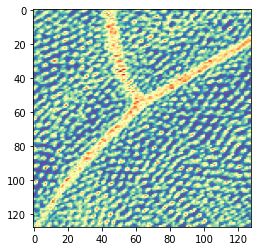

Epoch 25/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.3001 - accuracy: 0.9974 - val_loss: 0.6285 - val_accuracy: 0.9000

Epoch 00025: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6285138194050107, 'val_accuracy': 0.8999999761581421, 'loss': 0.3000796647540417, 'accuracy': 0.99736446, 'lr': 1e-06}


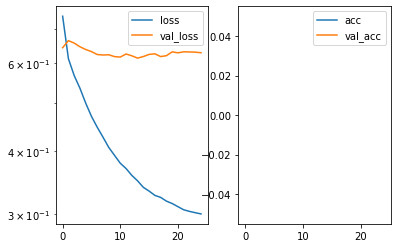

Predicted cell: Landmark Probability: [[0.9700819]]
True Cell type: Landmark
x [[0.64880913]]
True positional value x 0.578125
y [[0.4879085]]
True positional value y 0.578125


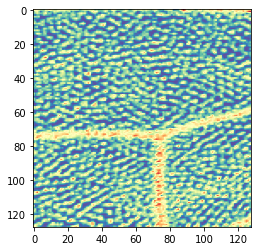

Epoch 26/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2973 - accuracy: 0.9981 - val_loss: 0.6336 - val_accuracy: 0.9071

Epoch 00026: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6336422945771899, 'val_accuracy': 0.9071428775787354, 'loss': 0.29733340765338345, 'accuracy': 0.99811745, 'lr': 1e-06}


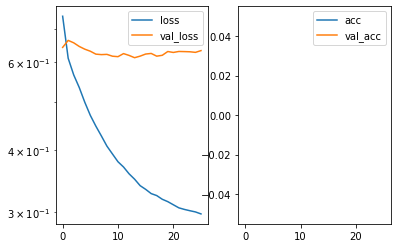

Predicted cell: Landmark Probability: [[0.9451736]]
True Cell type: Landmark
x [[0.427565]]
True positional value x 0.5
y [[0.54508483]]
True positional value y 0.421875


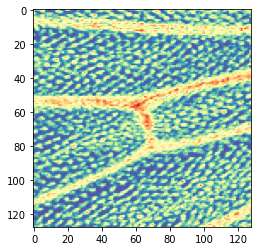

Epoch 27/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.2977 - accuracy: 0.9974 - val_loss: 0.6341 - val_accuracy: 0.9071

Epoch 00027: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6340675971337727, 'val_accuracy': 0.9071428775787354, 'loss': 0.2976888063172978, 'accuracy': 0.99736446, 'lr': 1e-06}


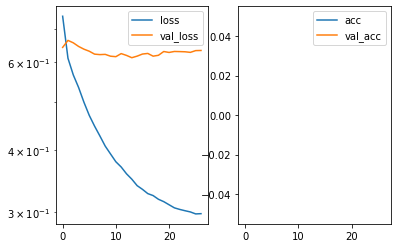

Predicted cell: Landmark Probability: [[0.96897036]]
True Cell type: Landmark
x [[0.48794812]]
True positional value x 0.578125
y [[0.7798064]]
True positional value y 0.421875


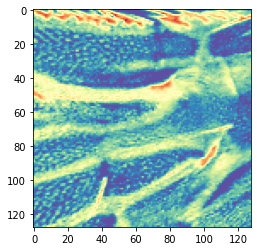

Epoch 28/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.2953 - accuracy: 0.9989 - val_loss: 0.6380 - val_accuracy: 0.9071

Epoch 00028: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6379542478493282, 'val_accuracy': 0.9071428775787354, 'loss': 0.2953175480241876, 'accuracy': 0.9988705, 'lr': 1e-06}


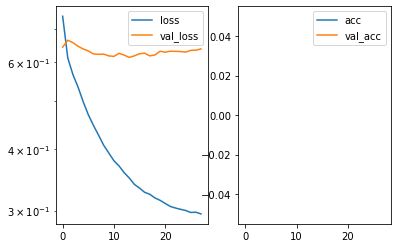

Predicted cell: Landmark Probability: [[0.9946392]]
True Cell type: Landmark
x [[0.44829935]]
True positional value x 0.5
y [[0.53414524]]
True positional value y 0.578125


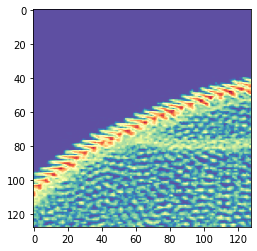

Epoch 29/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.2936 - accuracy: 0.9970 - val_loss: 0.6383 - val_accuracy: 0.9071

Epoch 00029: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6383000101361956, 'val_accuracy': 0.9071428775787354, 'loss': 0.29358911516526376, 'accuracy': 0.99698794, 'lr': 1e-06}


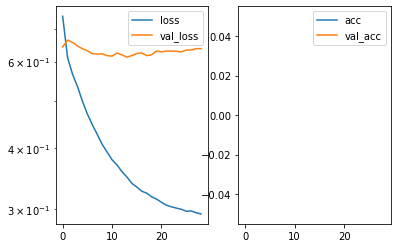

Predicted cell: Landmark Probability: [[0.9959998]]
True Cell type: Landmark
x [[0.59470457]]
True positional value x 0.421875
y [[0.42702955]]
True positional value y 0.421875


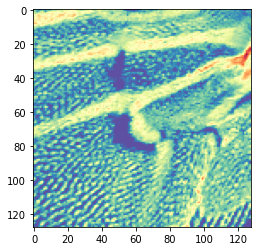

Epoch 30/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.2913 - accuracy: 0.9977 - val_loss: 0.6373 - val_accuracy: 0.9071

Epoch 00030: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6372814966099603, 'val_accuracy': 0.9071428775787354, 'loss': 0.291310360453215, 'accuracy': 0.997741, 'lr': 1e-06}


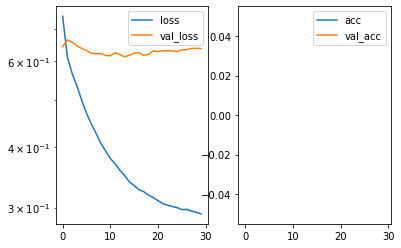

Predicted cell: Landmark Probability: [[0.9922482]]
True Cell type: Landmark
x [[0.32136258]]
True positional value x 0.5
y [[0.34237322]]
True positional value y 0.5


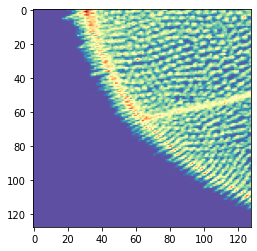

Epoch 31/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.2891 - accuracy: 0.9992 - val_loss: 0.6490 - val_accuracy: 0.9071

Epoch 00031: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6490366203444344, 'val_accuracy': 0.9071428775787354, 'loss': 0.28907362333532555, 'accuracy': 0.999247, 'lr': 1e-06}


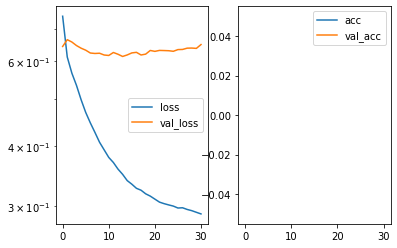

Predicted cell: Landmark Probability: [[0.83718675]]
True Cell type: Landmark
x [[0.5932391]]
True positional value x 0.421875
y [[0.43259558]]
True positional value y 0.421875


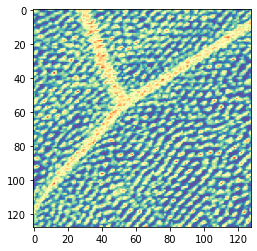

Epoch 32/250
2656/2656 [==============================] - 27s 10ms/step - loss: 0.2891 - accuracy: 0.9985 - val_loss: 0.6419 - val_accuracy: 0.9071

Epoch 00032: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6418523554291043, 'val_accuracy': 0.9071428775787354, 'loss': 0.2890663655272808, 'accuracy': 0.99849397, 'lr': 1e-06}


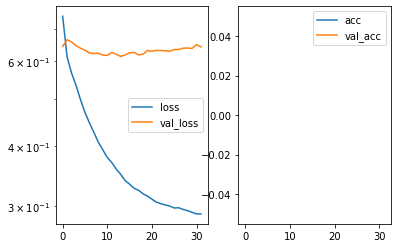

Predicted cell: Landmark Probability: [[0.72149605]]
True Cell type: Landmark
x [[0.5176771]]
True positional value x 0.578125
y [[0.5669781]]
True positional value y 0.578125


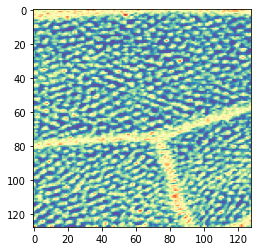

Epoch 33/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2852 - accuracy: 0.9992 - val_loss: 0.6435 - val_accuracy: 0.9071

Epoch 00033: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6435466281005314, 'val_accuracy': 0.9071428775787354, 'loss': 0.28519898994141313, 'accuracy': 0.999247, 'lr': 1e-06}


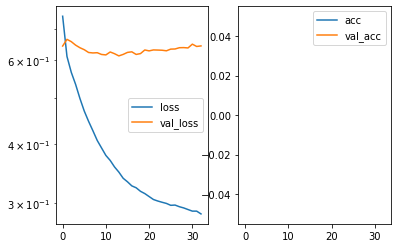

Predicted cell: Landmark Probability: [[0.9954443]]
True Cell type: Landmark
x [[0.66732]]
True positional value x 0.5
y [[0.43928918]]
True positional value y 0.5


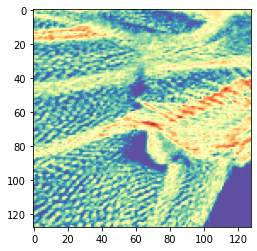

Epoch 34/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2861 - accuracy: 0.9996 - val_loss: 0.6433 - val_accuracy: 0.9071

Epoch 00034: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6432570815086365, 'val_accuracy': 0.9071428775787354, 'loss': 0.28609488991998044, 'accuracy': 0.9996235, 'lr': 1e-06}


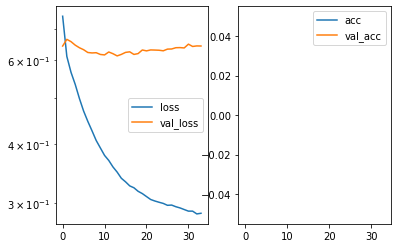

Predicted cell: Landmark Probability: [[0.7292041]]
True Cell type: Landmark
x [[0.507838]]
True positional value x 0.578125
y [[0.5656664]]
True positional value y 0.578125


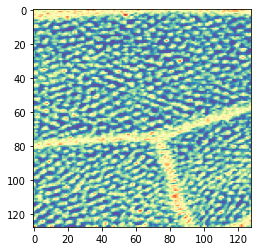

Epoch 35/250
2656/2656 [==============================] - 28s 11ms/step - loss: 0.2844 - accuracy: 0.9992 - val_loss: 0.6458 - val_accuracy: 0.9071

Epoch 00035: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6458259565489632, 'val_accuracy': 0.9071428775787354, 'loss': 0.28441965815622405, 'accuracy': 0.999247, 'lr': 1e-06}


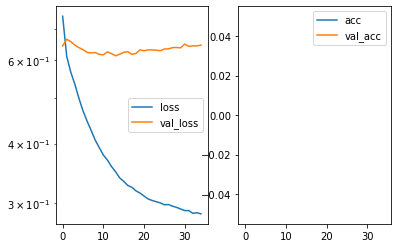

Predicted cell: Landmark Probability: [[0.9310332]]
True Cell type: Landmark
x [[0.45615318]]
True positional value x 0.421875
y [[0.6638297]]
True positional value y 0.5


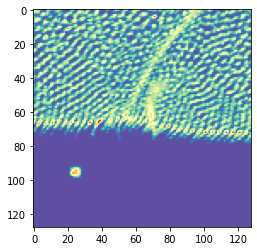

Epoch 36/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2857 - accuracy: 0.9996 - val_loss: 0.6454 - val_accuracy: 0.9071

Epoch 00036: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6453592415366854, 'val_accuracy': 0.9071428775787354, 'loss': 0.285723338487098, 'accuracy': 0.9996235, 'lr': 1e-06}


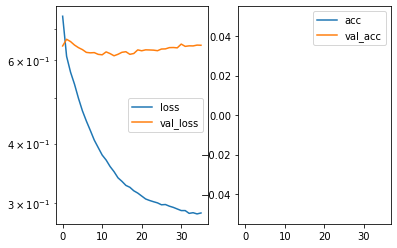

Predicted cell: Landmark Probability: [[0.9958437]]
True Cell type: Landmark
x [[0.32580435]]
True positional value x 0.421875
y [[0.7441709]]
True positional value y 0.578125


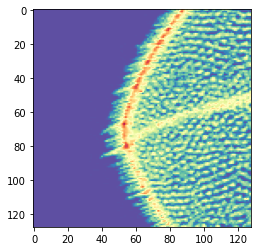

Epoch 37/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2833 - accuracy: 0.9985 - val_loss: 0.6487 - val_accuracy: 0.9071

Epoch 00037: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6486711629799434, 'val_accuracy': 0.9071428775787354, 'loss': 0.28328538142952575, 'accuracy': 0.99849397, 'lr': 1e-06}


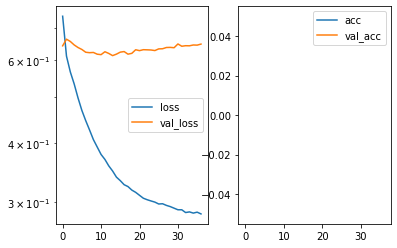

Predicted cell: Landmark Probability: [[0.98830056]]
True Cell type: Landmark
x [[0.57716584]]
True positional value x 0.578125
y [[0.33957082]]
True positional value y 0.421875


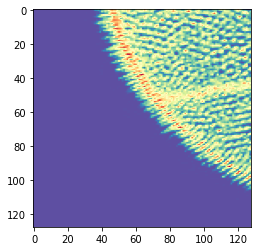

Epoch 38/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2826 - accuracy: 0.9981 - val_loss: 0.6494 - val_accuracy: 0.9071

Epoch 00038: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.649403378367424, 'val_accuracy': 0.9071428775787354, 'loss': 0.28259772614362727, 'accuracy': 0.99811745, 'lr': 1e-06}


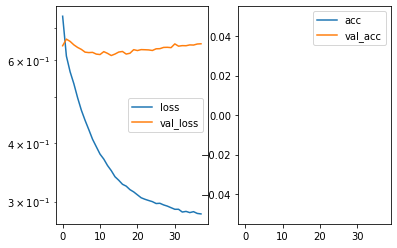

Predicted cell: Landmark Probability: [[0.99679834]]
True Cell type: Landmark
x [[0.35203293]]
True positional value x 0.5781249999999998
y [[0.27097744]]
True positional value y 0.421875


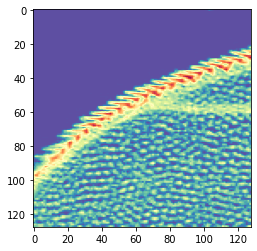

Epoch 39/250
2656/2656 [==============================] - 28s 11ms/step - loss: 0.2818 - accuracy: 0.9996 - val_loss: 0.6587 - val_accuracy: 0.9071

Epoch 00039: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6587103434971401, 'val_accuracy': 0.9071428775787354, 'loss': 0.2817519240485257, 'accuracy': 0.9996235, 'lr': 1e-06}


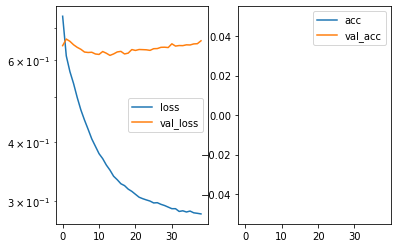

Predicted cell: Landmark Probability: [[0.99339664]]
True Cell type: Landmark
x [[0.6680196]]
True positional value x 0.578125
y [[0.6606312]]
True positional value y 0.5


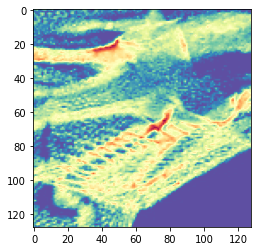

Epoch 40/250
2656/2656 [==============================] - 28s 11ms/step - loss: 0.2808 - accuracy: 0.9992 - val_loss: 0.6495 - val_accuracy: 0.9071

Epoch 00040: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6494782886334828, 'val_accuracy': 0.9071428775787354, 'loss': 0.28080333946609354, 'accuracy': 0.999247, 'lr': 1e-06}


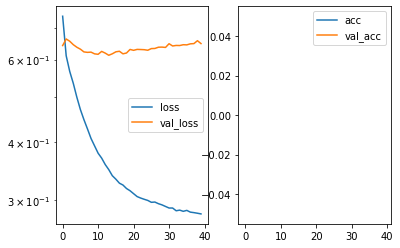

Predicted cell: Landmark Probability: [[0.95842475]]
True Cell type: Landmark
x [[0.43666723]]
True positional value x 0.578125
y [[0.35536095]]
True positional value y 0.421875


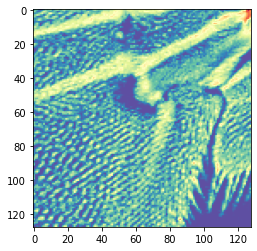

Epoch 41/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2794 - accuracy: 0.9996 - val_loss: 0.6528 - val_accuracy: 0.9071

Epoch 00041: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.652754721896989, 'val_accuracy': 0.9071428775787354, 'loss': 0.2793939152216337, 'accuracy': 0.9996235, 'lr': 1e-06}


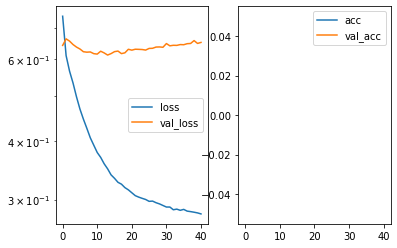

Predicted cell: Landmark Probability: [[0.96628034]]
True Cell type: Background
x [[0.36145112]]
True positional value x 0.5
y [[0.7372886]]
True positional value y 0.5


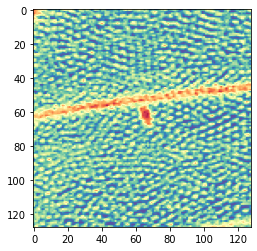

Epoch 42/250
2656/2656 [==============================] - 28s 10ms/step - loss: 0.2795 - accuracy: 0.9989 - val_loss: 0.6541 - val_accuracy: 0.9071

Epoch 00042: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6541383479322705, 'val_accuracy': 0.9071428775787354, 'loss': 0.2794501422848328, 'accuracy': 0.9988705, 'lr': 1e-06}


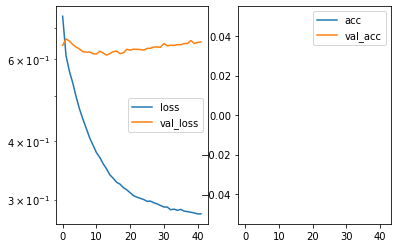

Predicted cell: Landmark Probability: [[0.9763564]]
True Cell type: Landmark
x [[0.782204]]
True positional value x 0.5
y [[0.6056194]]
True positional value y 0.578125


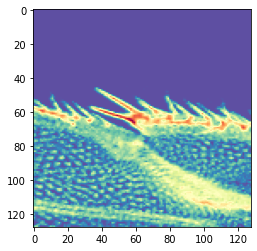

Epoch 43/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2790 - accuracy: 0.9992 - val_loss: 0.6596 - val_accuracy: 0.9071

Epoch 00043: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6596212663820812, 'val_accuracy': 0.9071428775787354, 'loss': 0.27899263900177307, 'accuracy': 0.999247, 'lr': 1e-06}


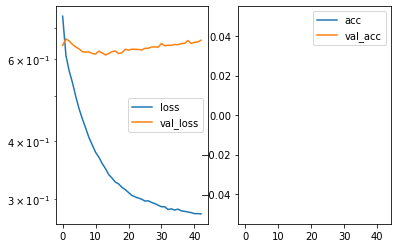

Predicted cell: Landmark Probability: [[0.99165756]]
True Cell type: Landmark
x [[0.66618043]]
True positional value x 0.5
y [[0.42570734]]
True positional value y 0.5


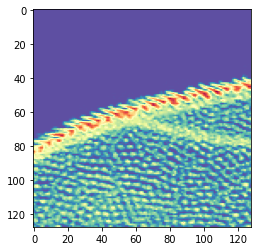

Epoch 44/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2798 - accuracy: 0.9992 - val_loss: 0.6534 - val_accuracy: 0.9071

Epoch 00044: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6533953888075692, 'val_accuracy': 0.9071428775787354, 'loss': 0.2798478491604328, 'accuracy': 0.999247, 'lr': 1e-06}


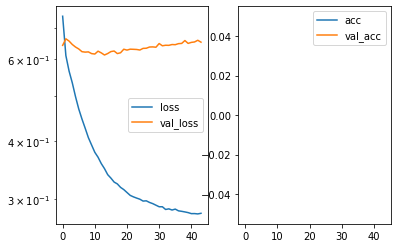

Predicted cell: Landmark Probability: [[0.99508494]]
True Cell type: Landmark
x [[0.60735357]]
True positional value x 0.578125
y [[0.4607185]]
True positional value y 0.578125


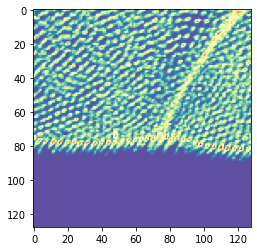

Epoch 45/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2770 - accuracy: 1.0000 - val_loss: 0.6630 - val_accuracy: 0.9071

Epoch 00045: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6630165108612606, 'val_accuracy': 0.9071428775787354, 'loss': 0.2769646968872073, 'accuracy': 1.0, 'lr': 1e-06}


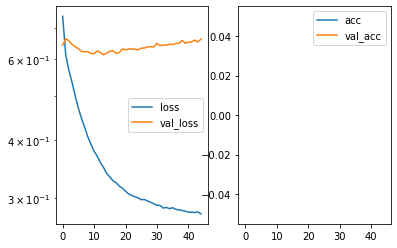

Predicted cell: Landmark Probability: [[0.9981135]]
True Cell type: Landmark
x [[0.31730404]]
True positional value x 0.578125
y [[0.48547965]]
True positional value y 0.578125


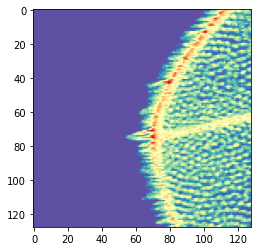

Epoch 46/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2786 - accuracy: 0.9989 - val_loss: 0.6535 - val_accuracy: 0.9071

Epoch 00046: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6534993520804814, 'val_accuracy': 0.9071428775787354, 'loss': 0.278587532712214, 'accuracy': 0.9988705, 'lr': 1e-06}


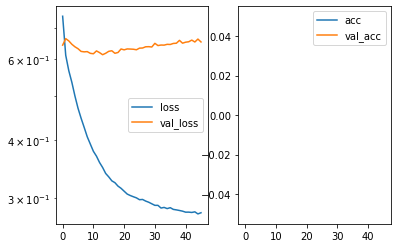

Predicted cell: Landmark Probability: [[0.98717725]]
True Cell type: Landmark
x [[0.5444806]]
True positional value x 0.421875
y [[0.7491285]]
True positional value y 0.578125


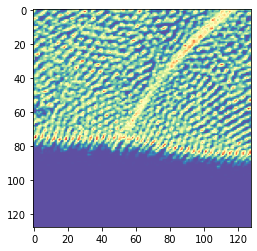

Epoch 47/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2772 - accuracy: 1.0000 - val_loss: 0.6624 - val_accuracy: 0.9071

Epoch 00047: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6623510590621403, 'val_accuracy': 0.9071428775787354, 'loss': 0.2772235524537693, 'accuracy': 1.0, 'lr': 1e-06}


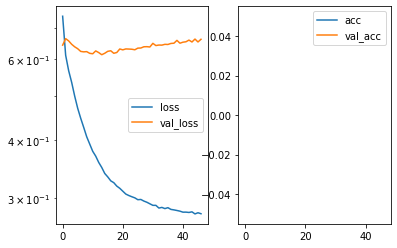

Predicted cell: Landmark Probability: [[0.9896516]]
True Cell type: Landmark
x [[0.7968613]]
True positional value x 0.578125
y [[0.70422447]]
True positional value y 0.421875


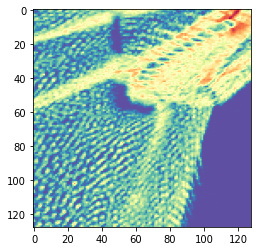

Epoch 48/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2762 - accuracy: 1.0000 - val_loss: 0.6674 - val_accuracy: 0.9071

Epoch 00048: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6674141436815262, 'val_accuracy': 0.9071428775787354, 'loss': 0.2761772322547005, 'accuracy': 1.0, 'lr': 1e-06}


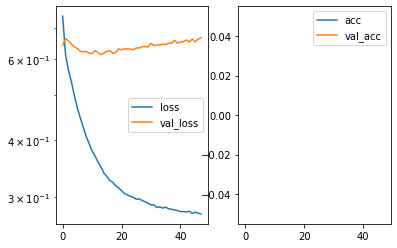

Predicted cell: Landmark Probability: [[0.995048]]
True Cell type: Landmark
x [[0.6913233]]
True positional value x 0.5
y [[0.47542155]]
True positional value y 0.5


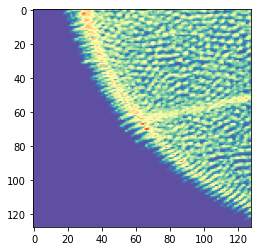

Epoch 49/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2757 - accuracy: 0.9996 - val_loss: 0.6668 - val_accuracy: 0.9071

Epoch 00049: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6667581285749163, 'val_accuracy': 0.9071428775787354, 'loss': 0.27565194385866804, 'accuracy': 0.9996235, 'lr': 1e-06}


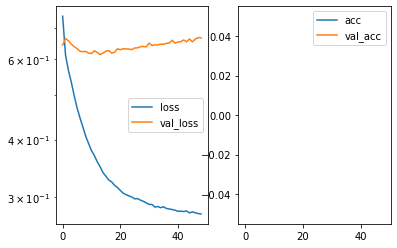

Predicted cell: Landmark Probability: [[0.9971353]]
True Cell type: Landmark
x [[0.380577]]
True positional value x 0.5
y [[0.5478225]]
True positional value y 0.5


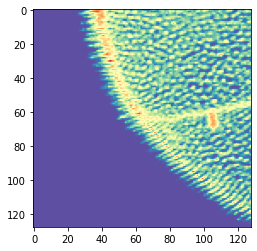

Epoch 50/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2749 - accuracy: 0.9996 - val_loss: 0.6669 - val_accuracy: 0.9071

Epoch 00050: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6668551734515599, 'val_accuracy': 0.9071428775787354, 'loss': 0.27488569596625234, 'accuracy': 0.9996235, 'lr': 1e-06}


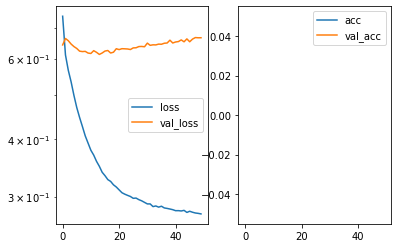

Predicted cell: Landmark Probability: [[0.9909095]]
True Cell type: Landmark
x [[0.65899557]]
True positional value x 0.5
y [[0.45113626]]
True positional value y 0.421875


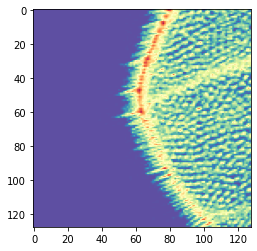

Epoch 51/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2755 - accuracy: 1.0000 - val_loss: 0.6683 - val_accuracy: 0.9071

Epoch 00051: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6683103995663779, 'val_accuracy': 0.9071428775787354, 'loss': 0.2754773532590234, 'accuracy': 1.0, 'lr': 1e-06}


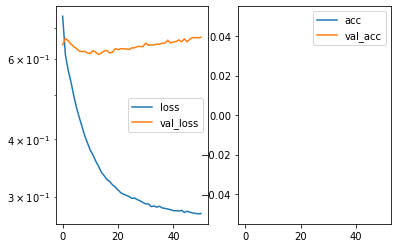

Predicted cell: Landmark Probability: [[0.9909593]]
True Cell type: Landmark
x [[0.46110314]]
True positional value x 0.421875
y [[0.6241862]]
True positional value y 0.421875


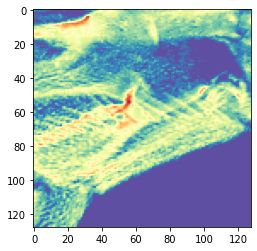

Epoch 52/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2746 - accuracy: 0.9996 - val_loss: 0.6591 - val_accuracy: 0.9071

Epoch 00052: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6591301070792335, 'val_accuracy': 0.9071428775787354, 'loss': 0.27463060866547634, 'accuracy': 0.9996235, 'lr': 1e-06}


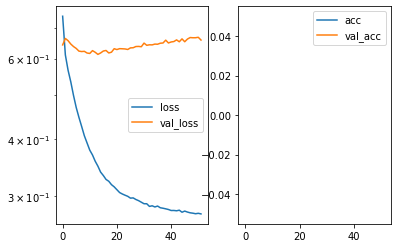

Predicted cell: Landmark Probability: [[0.9958467]]
True Cell type: Landmark
x [[0.41629842]]
True positional value x 0.5
y [[0.52026165]]
True positional value y 0.578125


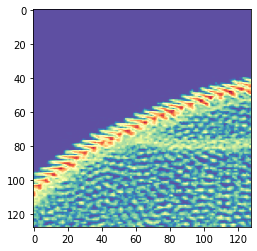

Epoch 53/250
2656/2656 [==============================] - 28s 11ms/step - loss: 0.2741 - accuracy: 0.9996 - val_loss: 0.6801 - val_accuracy: 0.9071

Epoch 00053: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6800872172628131, 'val_accuracy': 0.9071428775787354, 'loss': 0.27407016367258796, 'accuracy': 0.9996235, 'lr': 1e-06}


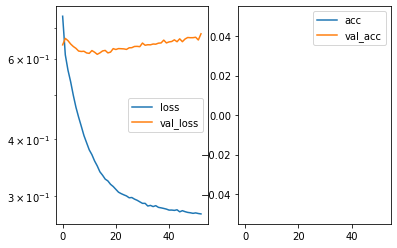

Predicted cell: Landmark Probability: [[0.9976827]]
True Cell type: Landmark
x [[0.43437174]]
True positional value x 0.578125
y [[0.5427105]]
True positional value y 0.5


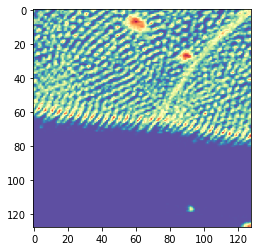

Epoch 54/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2733 - accuracy: 1.0000 - val_loss: 0.6761 - val_accuracy: 0.9071

Epoch 00054: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6761178395577839, 'val_accuracy': 0.9071428775787354, 'loss': 0.2732696651021041, 'accuracy': 1.0, 'lr': 1e-06}


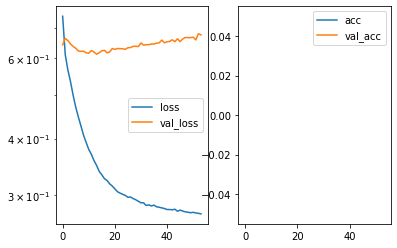

Predicted cell: Landmark Probability: [[0.9951748]]
True Cell type: Landmark
x [[0.7456909]]
True positional value x 0.578125
y [[0.6658664]]
True positional value y 0.5


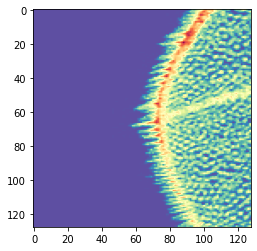

Epoch 55/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2727 - accuracy: 1.0000 - val_loss: 0.6791 - val_accuracy: 0.9071

Epoch 00055: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6791289214576993, 'val_accuracy': 0.9071428775787354, 'loss': 0.2726938077529152, 'accuracy': 1.0, 'lr': 1e-06}


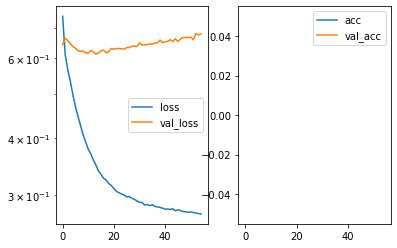

Predicted cell: Landmark Probability: [[0.9880911]]
True Cell type: Landmark
x [[0.53520185]]
True positional value x 0.5
y [[0.47066376]]
True positional value y 0.578125


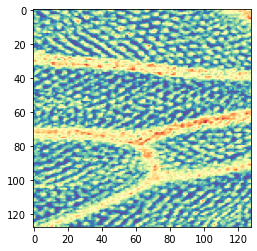

Epoch 56/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2730 - accuracy: 0.9996 - val_loss: 0.6719 - val_accuracy: 0.9071

Epoch 00056: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.671890703695161, 'val_accuracy': 0.9071428775787354, 'loss': 0.2729561210621193, 'accuracy': 0.9996235, 'lr': 1e-06}


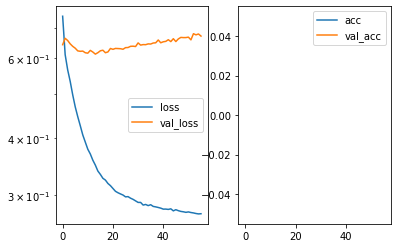

Predicted cell: Landmark Probability: [[0.97003293]]
True Cell type: Landmark
x [[0.4380168]]
True positional value x 0.421875
y [[0.20923997]]
True positional value y 0.5


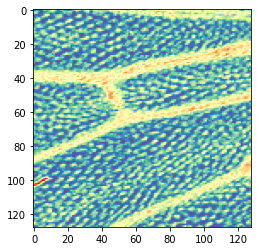

Epoch 57/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2728 - accuracy: 1.0000 - val_loss: 0.6708 - val_accuracy: 0.9071

Epoch 00057: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6707621621234077, 'val_accuracy': 0.9071428775787354, 'loss': 0.2727978857436094, 'accuracy': 1.0, 'lr': 1e-06}


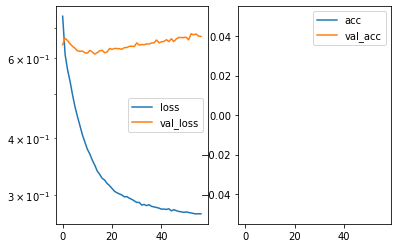

Predicted cell: Landmark Probability: [[0.98786736]]
True Cell type: Landmark
x [[0.5923923]]
True positional value x 0.5
y [[0.5830607]]
True positional value y 0.421875


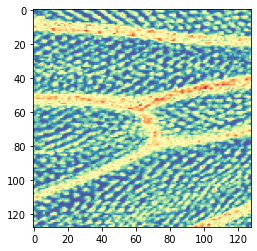

Epoch 58/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2723 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 0.9071

Epoch 00058: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6793813790593829, 'val_accuracy': 0.9071428775787354, 'loss': 0.272261272218213, 'accuracy': 1.0, 'lr': 1e-06}


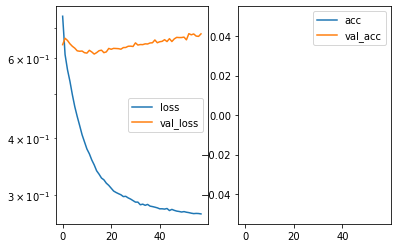

Predicted cell: Landmark Probability: [[0.99826604]]
True Cell type: Landmark
x [[0.63485885]]
True positional value x 0.578125
y [[0.56261677]]
True positional value y 0.578125


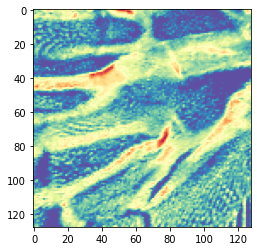

Epoch 59/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2725 - accuracy: 1.0000 - val_loss: 0.6731 - val_accuracy: 0.9071

Epoch 00059: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6730736792087555, 'val_accuracy': 0.9071428775787354, 'loss': 0.2724682888891323, 'accuracy': 1.0, 'lr': 1e-06}


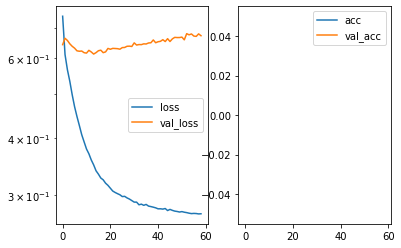

Predicted cell: Landmark Probability: [[0.992959]]
True Cell type: Landmark
x [[0.6421844]]
True positional value x 0.5
y [[0.45826325]]
True positional value y 0.421875


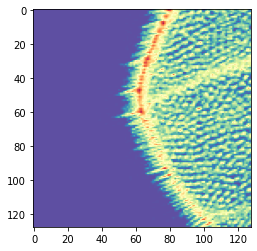

Epoch 60/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2720 - accuracy: 1.0000 - val_loss: 0.6772 - val_accuracy: 0.9071

Epoch 00060: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.677200681396893, 'val_accuracy': 0.9071428775787354, 'loss': 0.27197361351495764, 'accuracy': 1.0, 'lr': 1e-06}


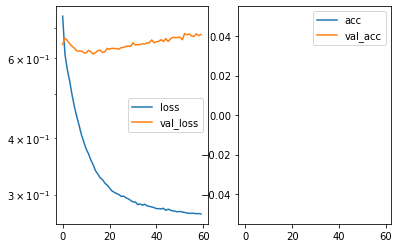

Predicted cell: Landmark Probability: [[0.96566695]]
True Cell type: Landmark
x [[0.51738393]]
True positional value x 0.421875
y [[0.32585067]]
True positional value y 0.421875


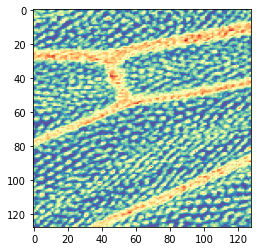

Epoch 61/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2710 - accuracy: 1.0000 - val_loss: 0.6800 - val_accuracy: 0.9071

Epoch 00061: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6800180801323482, 'val_accuracy': 0.9071428775787354, 'loss': 0.2710187224424388, 'accuracy': 1.0, 'lr': 1e-06}


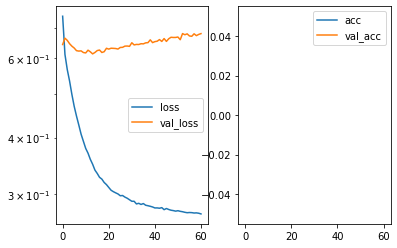

Predicted cell: Landmark Probability: [[0.9854534]]
True Cell type: Landmark
x [[0.7598788]]
True positional value x 0.5
y [[0.44468254]]
True positional value y 0.421875


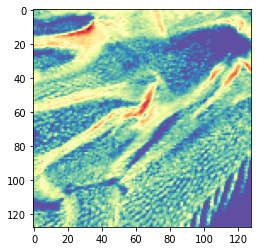

Epoch 62/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2708 - accuracy: 1.0000 - val_loss: 0.6813 - val_accuracy: 0.9071

Epoch 00062: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6812717233385358, 'val_accuracy': 0.9071428775787354, 'loss': 0.27081709649099645, 'accuracy': 1.0, 'lr': 1e-06}


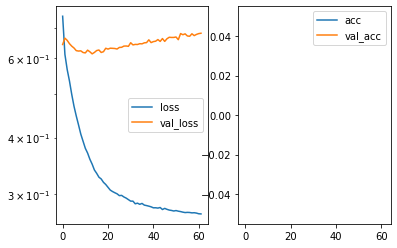

Predicted cell: Landmark Probability: [[0.9905342]]
True Cell type: Landmark
x [[0.57720655]]
True positional value x 0.578125
y [[0.5046045]]
True positional value y 0.421875


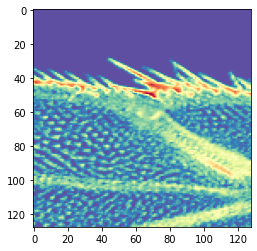

Epoch 63/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2697 - accuracy: 1.0000 - val_loss: 0.6847 - val_accuracy: 0.9071

Epoch 00063: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6847071030310222, 'val_accuracy': 0.9071428775787354, 'loss': 0.2697076632764684, 'accuracy': 1.0, 'lr': 1e-06}


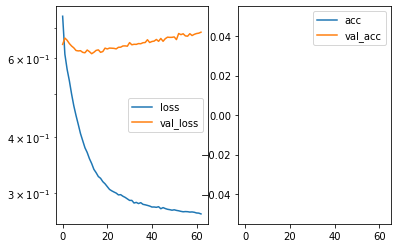

Predicted cell: Landmark Probability: [[0.997493]]
True Cell type: Landmark
x [[0.43571472]]
True positional value x 0.5
y [[0.51989126]]
True positional value y 0.578125


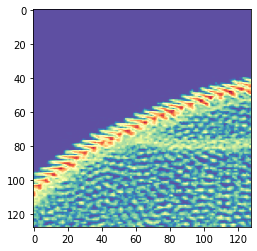

Epoch 64/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2705 - accuracy: 1.0000 - val_loss: 0.6814 - val_accuracy: 0.9071

Epoch 00064: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.681441958461489, 'val_accuracy': 0.9071428775787354, 'loss': 0.2705272812710469, 'accuracy': 1.0, 'lr': 1e-06}


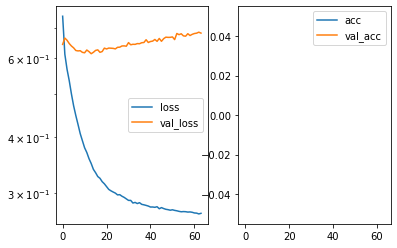

Predicted cell: Landmark Probability: [[0.99845946]]
True Cell type: Landmark
x [[0.45245847]]
True positional value x 0.421875
y [[0.661455]]
True positional value y 0.5


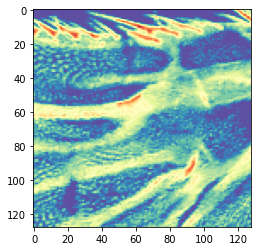

Epoch 65/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2700 - accuracy: 1.0000 - val_loss: 0.6795 - val_accuracy: 0.9071

Epoch 00065: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6795393505266735, 'val_accuracy': 0.9071428775787354, 'loss': 0.26999737582651967, 'accuracy': 1.0, 'lr': 1e-06}


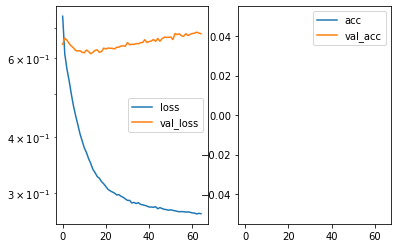

Predicted cell: Landmark Probability: [[0.9773458]]
True Cell type: Landmark
x [[0.42854556]]
True positional value x 0.578125
y [[0.34320065]]
True positional value y 0.421875


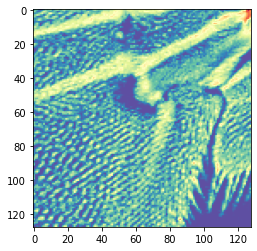

Epoch 66/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2699 - accuracy: 0.9996 - val_loss: 0.6813 - val_accuracy: 0.9071

Epoch 00066: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6813269704580307, 'val_accuracy': 0.9071428775787354, 'loss': 0.2699240434196699, 'accuracy': 0.9996235, 'lr': 1e-06}


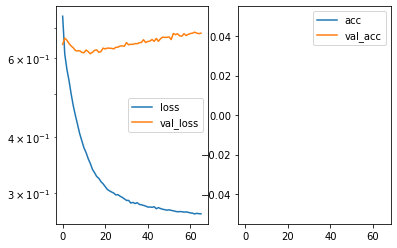

Predicted cell: Landmark Probability: [[0.9992661]]
True Cell type: Landmark
x [[0.71455103]]
True positional value x 0.578125
y [[0.428645]]
True positional value y 0.578125


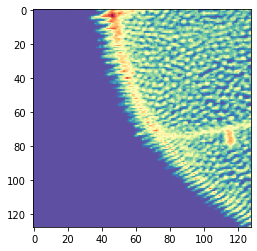

Epoch 67/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2704 - accuracy: 1.0000 - val_loss: 0.6734 - val_accuracy: 0.9071

Epoch 00067: ReduceLROnPlateau reducing learning rate to 9.999999974752428e-08.

Epoch 00067: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.673360002892358, 'val_accuracy': 0.9071428775787354, 'loss': 0.2704450637102127, 'accuracy': 1.0, 'lr': 1e-06}


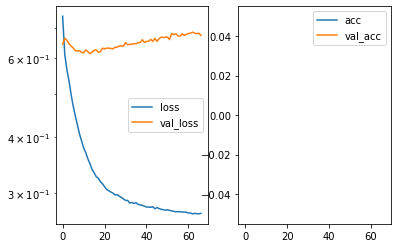

Predicted cell: Landmark Probability: [[0.9932172]]
True Cell type: Landmark
x [[0.2962722]]
True positional value x 0.5
y [[0.5330641]]
True positional value y 0.421875


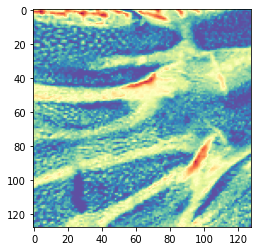

Epoch 68/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2701 - accuracy: 0.9996 - val_loss: 0.6781 - val_accuracy: 0.9071

Epoch 00068: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6781407913991383, 'val_accuracy': 0.9071428775787354, 'loss': 0.2701049426862274, 'accuracy': 0.9996235, 'lr': 1e-07}


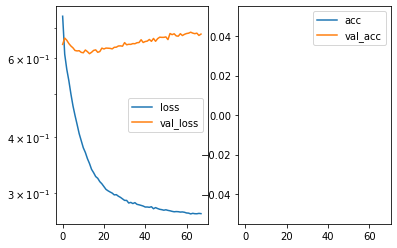

Predicted cell: Landmark Probability: [[0.99785477]]
True Cell type: Landmark
x [[0.30580825]]
True positional value x 0.5
y [[0.2562418]]
True positional value y 0.421875


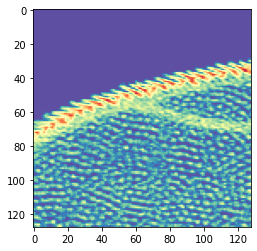

Epoch 69/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2701 - accuracy: 0.9996 - val_loss: 0.6786 - val_accuracy: 0.9071

Epoch 00069: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6786024336303983, 'val_accuracy': 0.9071428775787354, 'loss': 0.2701392354870058, 'accuracy': 0.9996235, 'lr': 1e-07}


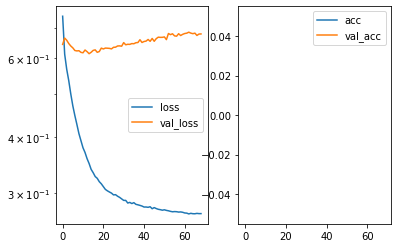

Predicted cell: Landmark Probability: [[0.99799204]]
True Cell type: Background
x [[0.67120415]]
True positional value x 0.5
y [[0.80623615]]
True positional value y 0.5


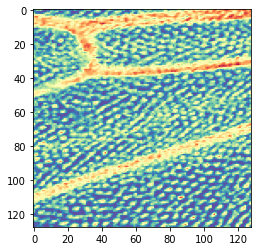

Epoch 70/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2702 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 0.9071

Epoch 00070: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6786637348788125, 'val_accuracy': 0.9071428775787354, 'loss': 0.27018713210541084, 'accuracy': 1.0, 'lr': 1e-07}


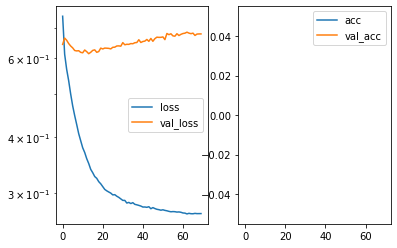

Predicted cell: Landmark Probability: [[0.9911028]]
True Cell type: Landmark
x [[0.41583303]]
True positional value x 0.421875
y [[0.4261385]]
True positional value y 0.5


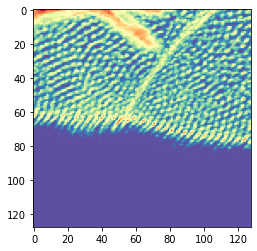

Epoch 71/250
2656/2656 [==============================] - 28s 11ms/step - loss: 0.2695 - accuracy: 1.0000 - val_loss: 0.6800 - val_accuracy: 0.9071

Epoch 00071: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6800127093281064, 'val_accuracy': 0.9071428775787354, 'loss': 0.26952208915209197, 'accuracy': 1.0, 'lr': 1e-07}


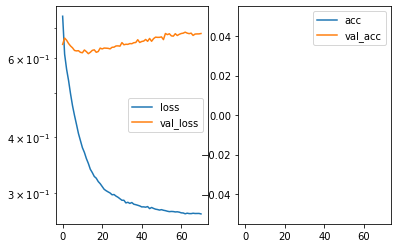

Predicted cell: Landmark Probability: [[0.9761404]]
True Cell type: Landmark
x [[0.46289623]]
True positional value x 0.421875
y [[0.41575944]]
True positional value y 0.578125


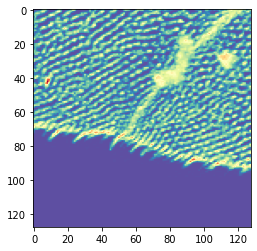

Epoch 72/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2694 - accuracy: 1.0000 - val_loss: 0.6819 - val_accuracy: 0.9071

Epoch 00072: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6818571537733078, 'val_accuracy': 0.9071428775787354, 'loss': 0.26943498645651054, 'accuracy': 1.0, 'lr': 1e-07}


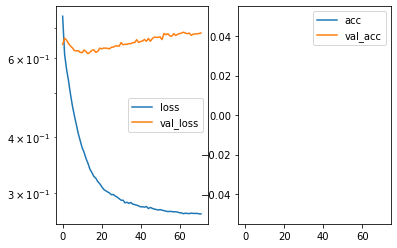

Predicted cell: Landmark Probability: [[0.97663987]]
True Cell type: Landmark
x [[0.42924005]]
True positional value x 0.421875
y [[0.22875088]]
True positional value y 0.5


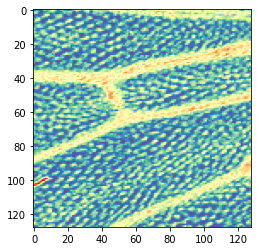

Epoch 73/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2707 - accuracy: 0.9992 - val_loss: 0.6805 - val_accuracy: 0.9071

Epoch 00073: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6804785196270261, 'val_accuracy': 0.9071428775787354, 'loss': 0.2706733181264745, 'accuracy': 0.999247, 'lr': 1e-07}


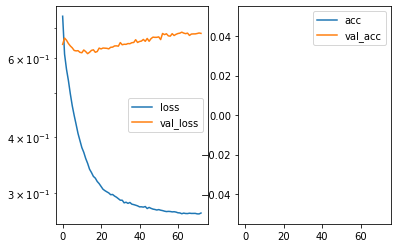

Predicted cell: Landmark Probability: [[0.99929583]]
True Cell type: Landmark
x [[0.7144554]]
True positional value x 0.578125
y [[0.42408752]]
True positional value y 0.578125


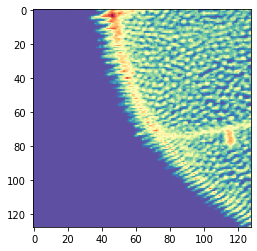

Epoch 74/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2704 - accuracy: 1.0000 - val_loss: 0.6788 - val_accuracy: 0.9071

Epoch 00074: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6787892409733364, 'val_accuracy': 0.9071428775787354, 'loss': 0.2704018863613706, 'accuracy': 1.0, 'lr': 1e-07}


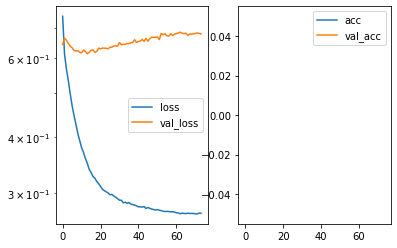

Predicted cell: Landmark Probability: [[0.99614954]]
True Cell type: Landmark
x [[0.25854206]]
True positional value x 0.421875
y [[0.3358705]]
True positional value y 0.5


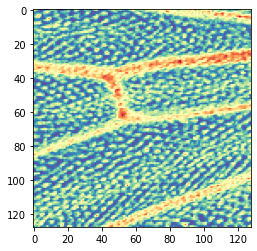

Epoch 75/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2702 - accuracy: 1.0000 - val_loss: 0.6796 - val_accuracy: 0.9071

Epoch 00075: ReduceLROnPlateau reducing learning rate to 1.0000000116860975e-08.

Epoch 00075: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.679561163697924, 'val_accuracy': 0.9071428775787354, 'loss': 0.2701666955218976, 'accuracy': 1.0, 'lr': 1e-07}


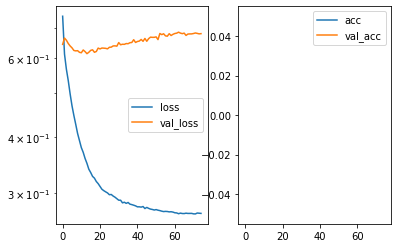

Predicted cell: Landmark Probability: [[0.99797016]]
True Cell type: Landmark
x [[0.64230126]]
True positional value x 0.5
y [[0.6640999]]
True positional value y 0.5


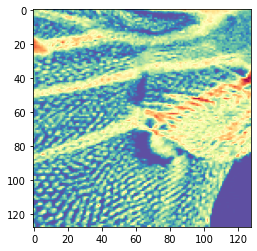

Epoch 76/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2690 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 0.9071

Epoch 00076: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6793762637036187, 'val_accuracy': 0.9071428775787354, 'loss': 0.26895709647740945, 'accuracy': 1.0, 'lr': 1e-08}


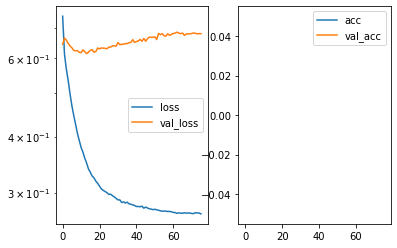

Predicted cell: Landmark Probability: [[0.9932579]]
True Cell type: Landmark
x [[0.39184922]]
True positional value x 0.421875
y [[0.64908534]]
True positional value y 0.578125


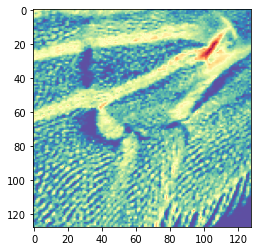

Epoch 77/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2694 - accuracy: 1.0000 - val_loss: 0.6796 - val_accuracy: 0.9071

Epoch 00077: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6796310096979141, 'val_accuracy': 0.9071428775787354, 'loss': 0.269351885755019, 'accuracy': 1.0, 'lr': 1e-08}


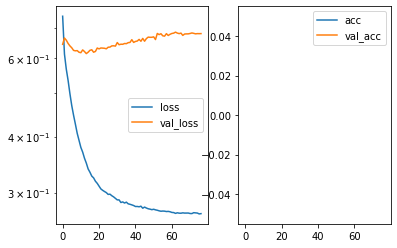

Predicted cell: Landmark Probability: [[0.99379975]]
True Cell type: Landmark
x [[0.63358384]]
True positional value x 0.5
y [[0.45113835]]
True positional value y 0.421875


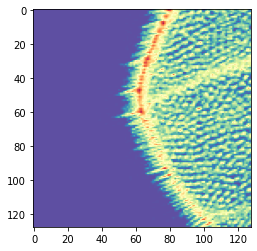

Epoch 78/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2705 - accuracy: 0.9996 - val_loss: 0.6797 - val_accuracy: 0.9071

Epoch 00078: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6797481285674232, 'val_accuracy': 0.9071428775787354, 'loss': 0.27050243297883547, 'accuracy': 0.9996235, 'lr': 1e-08}


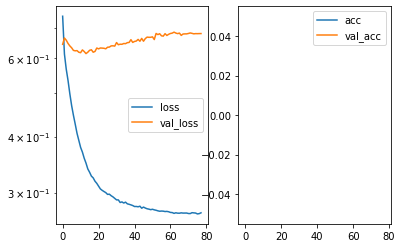

Predicted cell: Landmark Probability: [[0.9904942]]
True Cell type: Landmark
x [[0.5078206]]
True positional value x 0.421875
y [[0.23319173]]
True positional value y 0.578125


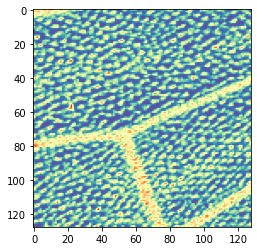

Epoch 79/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2699 - accuracy: 1.0000 - val_loss: 0.6799 - val_accuracy: 0.9071

Epoch 00079: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.679912982242448, 'val_accuracy': 0.9071428775787354, 'loss': 0.26991783349539145, 'accuracy': 1.0, 'lr': 1e-08}


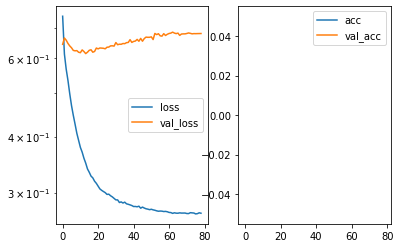

Predicted cell: Landmark Probability: [[0.96875125]]
True Cell type: Landmark
x [[0.6119897]]
True positional value x 0.578125
y [[0.25474486]]
True positional value y 0.5


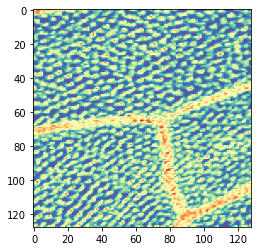

Epoch 80/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2705 - accuracy: 1.0000 - val_loss: 0.6796 - val_accuracy: 0.9071

Epoch 00080: ReduceLROnPlateau reducing learning rate to 9.999999939225292e-10.

Epoch 00080: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6796341176543917, 'val_accuracy': 0.9071428775787354, 'loss': 0.27049062874572105, 'accuracy': 1.0, 'lr': 1e-08}


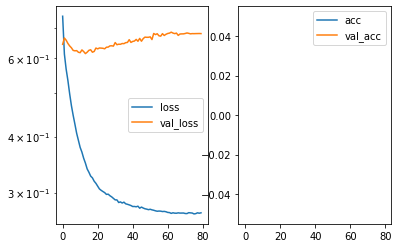

Predicted cell: Landmark Probability: [[0.99153507]]
True Cell type: Landmark
x [[0.5646335]]
True positional value x 0.578125
y [[0.50841695]]
True positional value y 0.421875


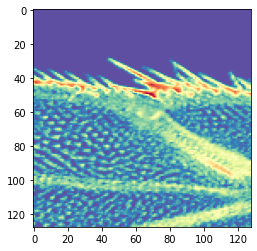

Epoch 81/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2696 - accuracy: 1.0000 - val_loss: 0.6798 - val_accuracy: 0.9071

Epoch 00081: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6798157117196492, 'val_accuracy': 0.9071428775787354, 'loss': 0.2695628755153662, 'accuracy': 1.0, 'lr': 1e-09}


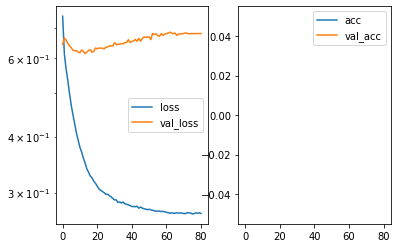

Predicted cell: Landmark Probability: [[0.9924614]]
True Cell type: Landmark
x [[0.5467519]]
True positional value x 0.421875
y [[0.7324032]]
True positional value y 0.578125


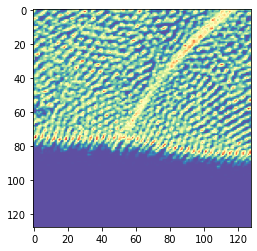

Epoch 82/250
2656/2656 [==============================] - 28s 11ms/step - loss: 0.2706 - accuracy: 0.9992 - val_loss: 0.6789 - val_accuracy: 0.9071

Epoch 00082: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6788912138768605, 'val_accuracy': 0.9071428775787354, 'loss': 0.27061848001307753, 'accuracy': 0.999247, 'lr': 1e-09}


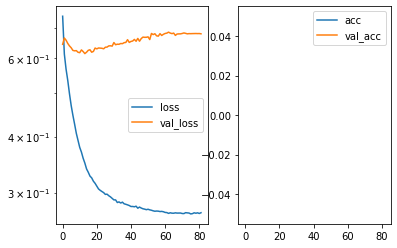

Predicted cell: Landmark Probability: [[0.99466383]]
True Cell type: Landmark
x [[0.5781107]]
True positional value x 0.578125
y [[0.50704724]]
True positional value y 0.578125


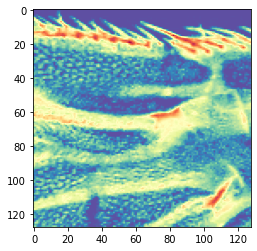

Epoch 83/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2697 - accuracy: 1.0000 - val_loss: 0.6804 - val_accuracy: 0.9071

Epoch 00083: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6803936000381198, 'val_accuracy': 0.9071428775787354, 'loss': 0.26973409636552076, 'accuracy': 1.0, 'lr': 1e-09}


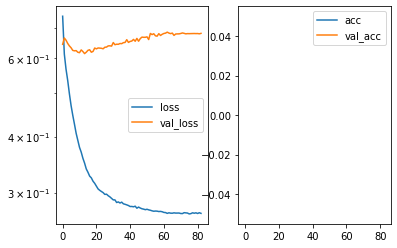

Predicted cell: Landmark Probability: [[0.9992119]]
True Cell type: Landmark
x [[0.36662376]]
True positional value x 0.578125
y [[0.71873623]]
True positional value y 0.5


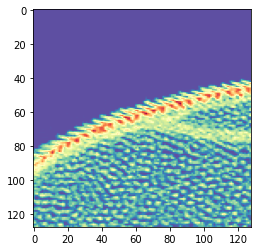

Epoch 84/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2699 - accuracy: 1.0000 - val_loss: 0.6795 - val_accuracy: 0.9071

Epoch 00084: ReduceLROnPlateau reducing learning rate to 9.999999717180686e-11.

Epoch 00084: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6794678036655698, 'val_accuracy': 0.9071428775787354, 'loss': 0.2699497869933944, 'accuracy': 1.0, 'lr': 1e-09}


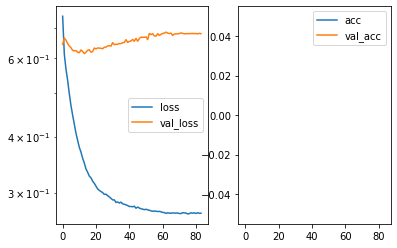

Predicted cell: Landmark Probability: [[0.99441624]]
True Cell type: Landmark
x [[0.6785362]]
True positional value x 0.5
y [[0.6912453]]
True positional value y 0.5


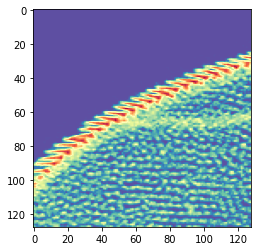

Epoch 85/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2692 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 0.9071

Epoch 00085: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6793869073901858, 'val_accuracy': 0.9071428775787354, 'loss': 0.2692085530115179, 'accuracy': 1.0, 'lr': 9.9999994e-11}


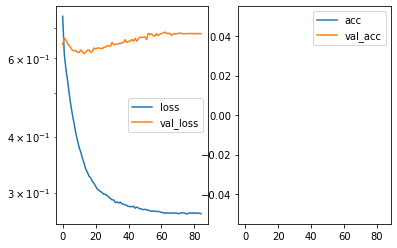

Predicted cell: Landmark Probability: [[0.99858665]]
True Cell type: Landmark
x [[0.24217157]]
True positional value x 0.421875
y [[0.5284075]]
True positional value y 0.578125


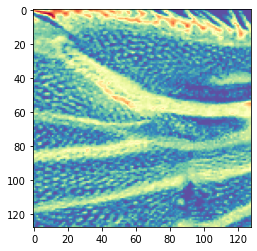

Epoch 86/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2703 - accuracy: 0.9996 - val_loss: 0.6796 - val_accuracy: 0.9071

Epoch 00086: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6795721841709954, 'val_accuracy': 0.9071428775787354, 'loss': 0.2702802705118455, 'accuracy': 0.9996235, 'lr': 9.9999994e-11}


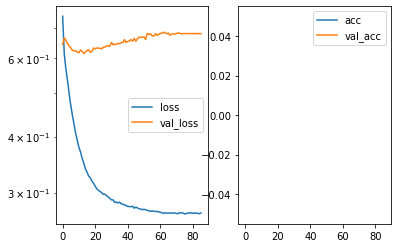

Predicted cell: Landmark Probability: [[0.9984931]]
True Cell type: Landmark
x [[0.476785]]
True positional value x 0.421875
y [[0.6755795]]
True positional value y 0.5


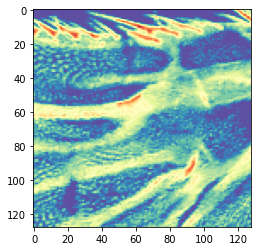

Epoch 87/250
2656/2656 [==============================] - 31s 12ms/step - loss: 0.2697 - accuracy: 1.0000 - val_loss: 0.6799 - val_accuracy: 0.9071

Epoch 00087: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6798878886869976, 'val_accuracy': 0.9071428775787354, 'loss': 0.2696882876601205, 'accuracy': 1.0, 'lr': 9.9999994e-11}


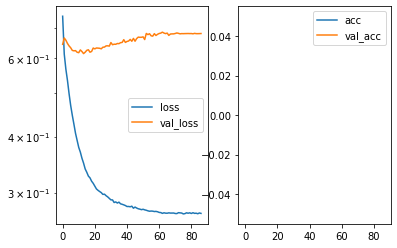

Predicted cell: Landmark Probability: [[0.9897842]]
True Cell type: Landmark
x [[0.5011179]]
True positional value x 0.578125
y [[0.8029475]]
True positional value y 0.421875


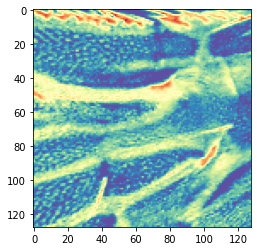

Epoch 88/250
2656/2656 [==============================] - 30s 11ms/step - loss: 0.2701 - accuracy: 0.9996 - val_loss: 0.6797 - val_accuracy: 0.9071

Epoch 00088: ReduceLROnPlateau reducing learning rate to 9.99999943962493e-12.

Epoch 00088: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6796620935201645, 'val_accuracy': 0.9071428775787354, 'loss': 0.2700725771172578, 'accuracy': 0.9996235, 'lr': 9.9999994e-11}


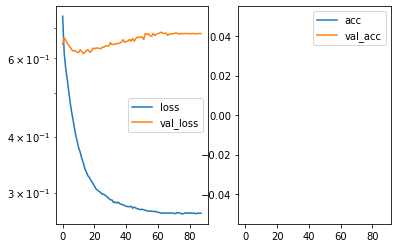

Predicted cell: Landmark Probability: [[0.9883599]]
True Cell type: Background
x [[0.40746662]]
True positional value x 0.5
y [[0.19227776]]
True positional value y 0.5


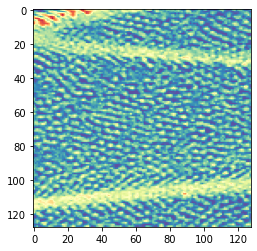

Epoch 89/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2691 - accuracy: 1.0000 - val_loss: 0.6798 - val_accuracy: 0.9071

Epoch 00089: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6798255230699267, 'val_accuracy': 0.9071428775787354, 'loss': 0.26910539640181036, 'accuracy': 1.0, 'lr': 9.999999e-12}


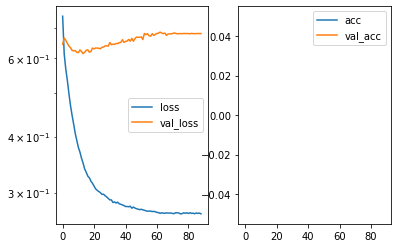

Predicted cell: Landmark Probability: [[0.9865248]]
True Cell type: Landmark
x [[0.67817146]]
True positional value x 0.578125
y [[0.55013555]]
True positional value y 0.578125


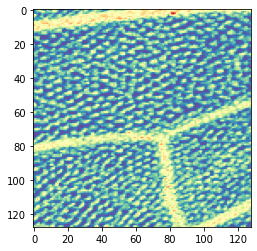

Epoch 90/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2691 - accuracy: 1.0000 - val_loss: 0.6807 - val_accuracy: 0.9071

Epoch 00090: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6807495419468198, 'val_accuracy': 0.9071428775787354, 'loss': 0.2691372003271637, 'accuracy': 1.0, 'lr': 9.999999e-12}


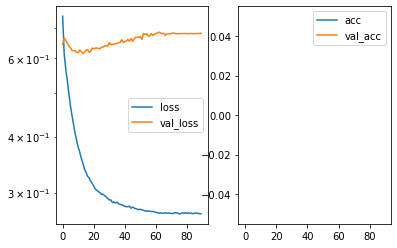

Predicted cell: Landmark Probability: [[0.97892886]]
True Cell type: Landmark
x [[0.6897192]]
True positional value x 0.421875
y [[0.38471422]]
True positional value y 0.5


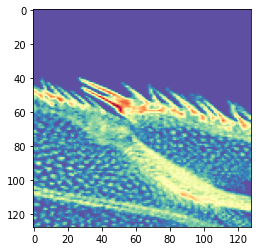

Epoch 91/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2697 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 0.9071

Epoch 00091: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6787154227495193, 'val_accuracy': 0.9071428775787354, 'loss': 0.2696754971451788, 'accuracy': 1.0, 'lr': 9.999999e-12}


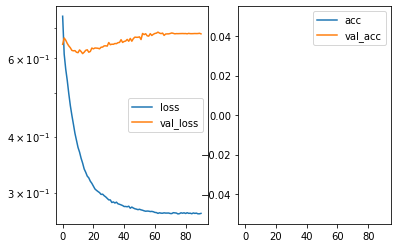

Predicted cell: Landmark Probability: [[0.99280494]]
True Cell type: Landmark
x [[0.724841]]
True positional value x 0.5
y [[0.2860833]]
True positional value y 0.578125


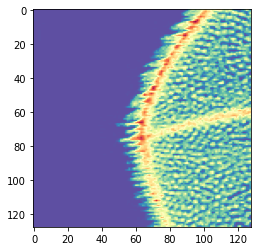

Epoch 92/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2693 - accuracy: 1.0000 - val_loss: 0.6789 - val_accuracy: 0.9071

Epoch 00092: ReduceLROnPlateau reducing learning rate to 9.999999092680235e-13.

Epoch 00092: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6789080053567886, 'val_accuracy': 0.9071428775787354, 'loss': 0.26926539914615183, 'accuracy': 1.0, 'lr': 9.999999e-12}


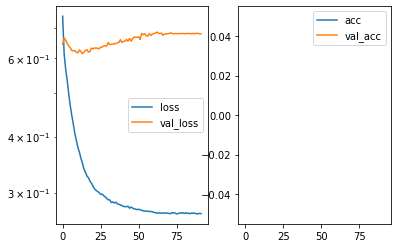

Predicted cell: Landmark Probability: [[0.99804485]]
True Cell type: Landmark
x [[0.6540407]]
True positional value x 0.421875
y [[0.6446645]]
True positional value y 0.5


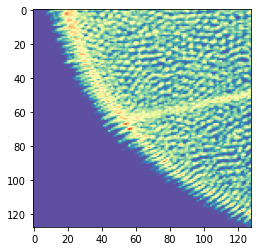

Epoch 93/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2693 - accuracy: 1.0000 - val_loss: 0.6799 - val_accuracy: 0.9071

Epoch 00093: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6799443066120148, 'val_accuracy': 0.9071428775787354, 'loss': 0.2693206152867481, 'accuracy': 1.0, 'lr': 9.999999e-13}


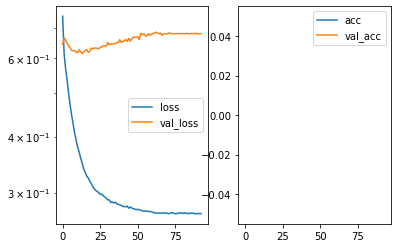

Predicted cell: Landmark Probability: [[0.99384165]]
True Cell type: Landmark
x [[0.286891]]
True positional value x 0.421875
y [[0.6193924]]
True positional value y 0.578125


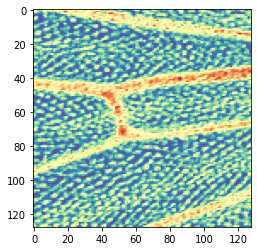

Epoch 94/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2696 - accuracy: 1.0000 - val_loss: 0.6804 - val_accuracy: 0.9071

Epoch 00094: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6803817749023438, 'val_accuracy': 0.9071428775787354, 'loss': 0.26964357591806404, 'accuracy': 1.0, 'lr': 9.999999e-13}


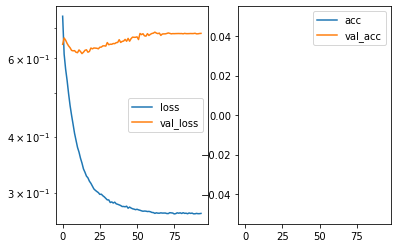

Predicted cell: Landmark Probability: [[0.99620795]]
True Cell type: Landmark
x [[0.55733347]]
True positional value x 0.5
y [[0.3335349]]
True positional value y 0.5


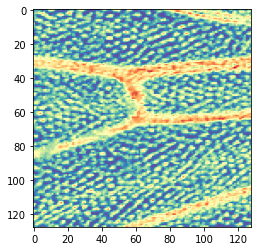

Epoch 95/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2685 - accuracy: 0.9996 - val_loss: 0.6807 - val_accuracy: 0.9071

Epoch 00095: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6806919340576444, 'val_accuracy': 0.9071428775787354, 'loss': 0.26852782099810707, 'accuracy': 0.9996235, 'lr': 9.999999e-13}


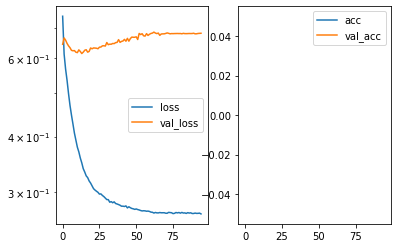

Predicted cell: Landmark Probability: [[0.7837038]]
True Cell type: Landmark
x [[0.51785105]]
True positional value x 0.578125
y [[0.55440325]]
True positional value y 0.578125


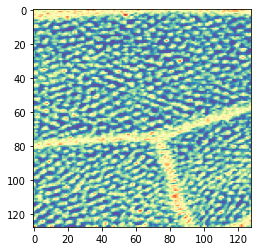

Epoch 96/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2692 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 0.9071

Epoch 00096: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6793944367340633, 'val_accuracy': 0.9071428775787354, 'loss': 0.2691623520285609, 'accuracy': 1.0, 'lr': 9.999999e-13}


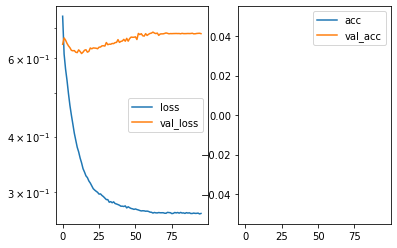

Predicted cell: Landmark Probability: [[0.9942682]]
True Cell type: Landmark
x [[0.6785941]]
True positional value x 0.5
y [[0.68863964]]
True positional value y 0.5


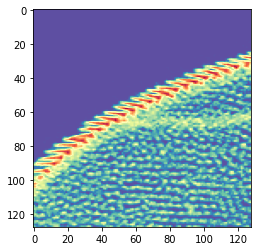

Epoch 97/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2694 - accuracy: 1.0000 - val_loss: 0.6797 - val_accuracy: 0.9071

Epoch 00097: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6796555433954511, 'val_accuracy': 0.9071428775787354, 'loss': 0.2694408074694585, 'accuracy': 1.0, 'lr': 9.999999e-13}


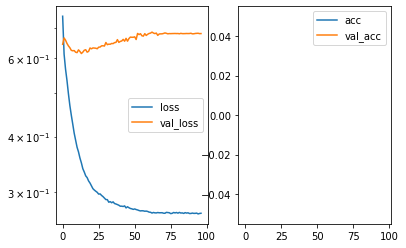

Predicted cell: Landmark Probability: [[0.96317476]]
True Cell type: Background
x [[0.53198946]]
True positional value x 0.5
y [[0.34587476]]
True positional value y 0.5


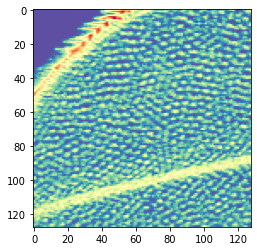

Epoch 98/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2698 - accuracy: 1.0000 - val_loss: 0.6785 - val_accuracy: 0.9071

Epoch 00098: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6785355103867394, 'val_accuracy': 0.9071428775787354, 'loss': 0.2697530657008111, 'accuracy': 1.0, 'lr': 9.999999e-13}


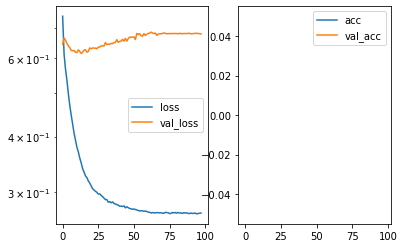

Predicted cell: Landmark Probability: [[0.9597257]]
True Cell type: Landmark
x [[0.44772363]]
True positional value x 0.421875
y [[0.6550863]]
True positional value y 0.5


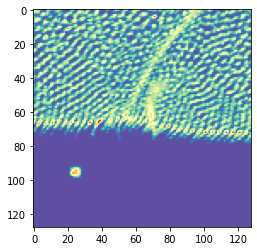

Epoch 99/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2698 - accuracy: 1.0000 - val_loss: 0.6789 - val_accuracy: 0.9071

Epoch 00099: ReduceLROnPlateau reducing learning rate to 9.9999988758398e-14.

Epoch 00099: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6789461438144956, 'val_accuracy': 0.9071428775787354, 'loss': 0.2698157808283366, 'accuracy': 1.0, 'lr': 9.999999e-13}


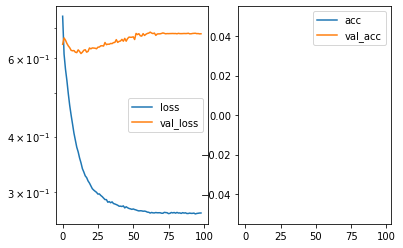

Predicted cell: Landmark Probability: [[0.9988745]]
True Cell type: Landmark
x [[0.5614447]]
True positional value x 0.5
y [[0.47041935]]
True positional value y 0.421875


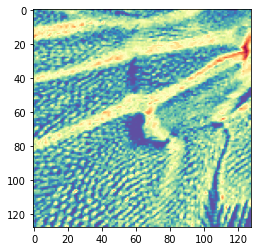

Epoch 100/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2698 - accuracy: 0.9996 - val_loss: 0.6797 - val_accuracy: 0.9071

Epoch 00100: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6796667511974063, 'val_accuracy': 0.9071428775787354, 'loss': 0.2698376309575446, 'accuracy': 0.9996235, 'lr': 9.999999e-14}


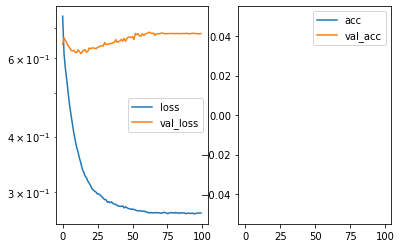

Predicted cell: Landmark Probability: [[0.9992235]]
True Cell type: Landmark
x [[0.3594315]]
True positional value x 0.578125
y [[0.7075832]]
True positional value y 0.5


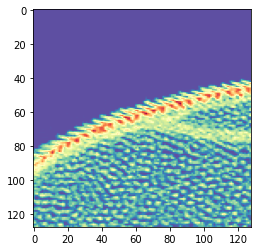

Epoch 101/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2703 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 0.9071

Epoch 00101: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6793764701911381, 'val_accuracy': 0.9071428775787354, 'loss': 0.2702974378389407, 'accuracy': 1.0, 'lr': 9.999999e-14}


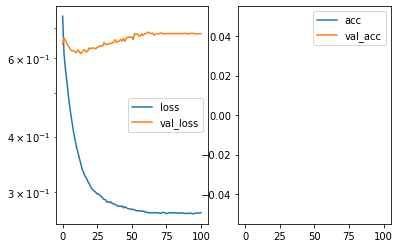

Predicted cell: Landmark Probability: [[0.99046725]]
True Cell type: Landmark
x [[0.60207874]]
True positional value x 0.5
y [[0.74152195]]
True positional value y 0.5


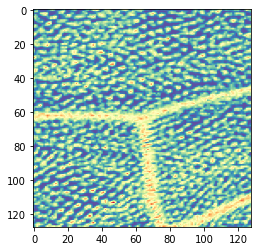

Epoch 102/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2694 - accuracy: 0.9996 - val_loss: 0.6795 - val_accuracy: 0.9071

Epoch 00102: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6795005862201963, 'val_accuracy': 0.9071428775787354, 'loss': 0.2694348463092942, 'accuracy': 0.9996235, 'lr': 9.999999e-14}


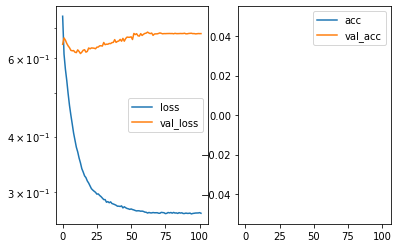

Predicted cell: Landmark Probability: [[0.99304354]]
True Cell type: Landmark
x [[0.3878428]]
True positional value x 0.421875
y [[0.6545832]]
True positional value y 0.578125


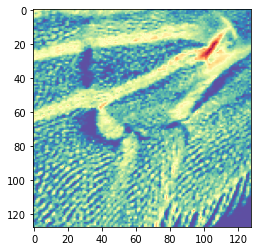

Epoch 103/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2695 - accuracy: 0.9996 - val_loss: 0.6794 - val_accuracy: 0.9071

Epoch 00103: ReduceLROnPlateau reducing learning rate to 9.999999146890344e-15.

Epoch 00103: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6794289903981345, 'val_accuracy': 0.9071428775787354, 'loss': 0.26945365038532093, 'accuracy': 0.9996235, 'lr': 9.999999e-14}


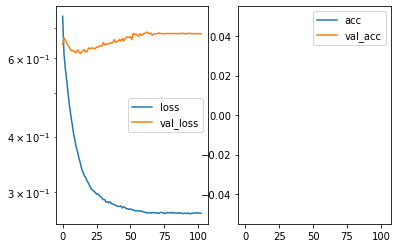

Predicted cell: Landmark Probability: [[0.962981]]
True Cell type: Landmark
x [[0.43640506]]
True positional value x 0.421875
y [[0.65970653]]
True positional value y 0.5


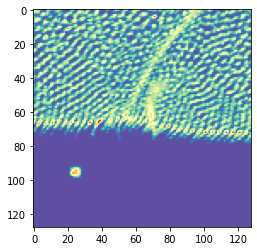

Epoch 104/250
2656/2656 [==============================] - 28s 11ms/step - loss: 0.2696 - accuracy: 1.0000 - val_loss: 0.6797 - val_accuracy: 0.9071

Epoch 00104: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6797465171132769, 'val_accuracy': 0.9071428775787354, 'loss': 0.269590507766389, 'accuracy': 1.0, 'lr': 9.999999e-15}


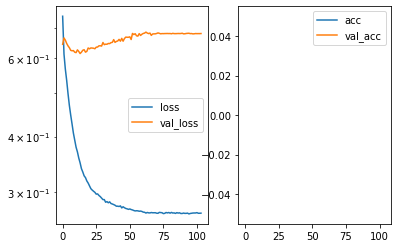

Predicted cell: Landmark Probability: [[0.9935307]]
True Cell type: Landmark
x [[0.40392166]]
True positional value x 0.421875
y [[0.64634407]]
True positional value y 0.578125


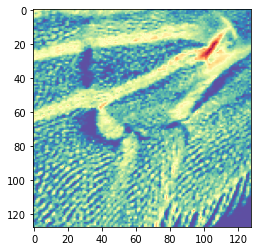

Epoch 105/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2694 - accuracy: 1.0000 - val_loss: 0.6801 - val_accuracy: 0.9071

Epoch 00105: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6800835409334728, 'val_accuracy': 0.9071428775787354, 'loss': 0.269369792529797, 'accuracy': 1.0, 'lr': 9.999999e-15}


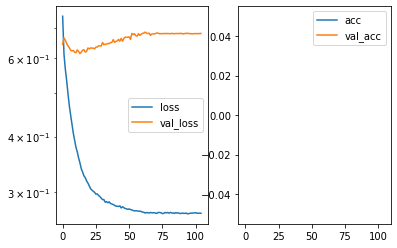

Predicted cell: Landmark Probability: [[0.99263436]]
True Cell type: Landmark
x [[0.3165269]]
True positional value x 0.5
y [[0.5178383]]
True positional value y 0.421875


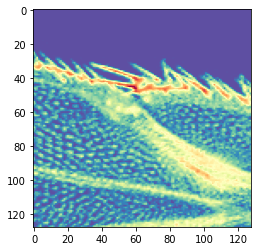

Epoch 106/250
2656/2656 [==============================] - 29s 11ms/step - loss: 0.2695 - accuracy: 1.0000 - val_loss: 0.6797 - val_accuracy: 0.9071

Epoch 00106: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7.h5
{'val_loss': 0.6796526674713407, 'val_accuracy': 0.9071428775787354, 'loss': 0.2695316921650286, 'accuracy': 1.0, 'lr': 9.999999e-15}


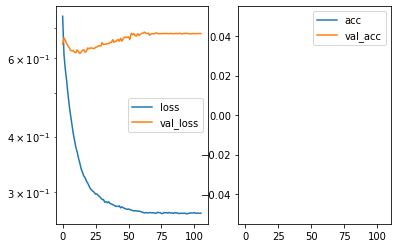

Predicted cell: Landmark Probability: [[0.9969637]]
True Cell type: Landmark
x [[0.36539188]]
True positional value x 0.5
y [[0.71203655]]
True positional value y 0.578125


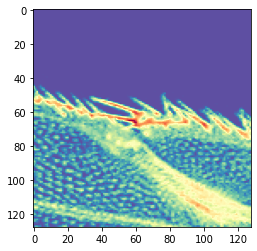

Epoch 107/250
1600/2656 [=================>............] - ETA: 11s - loss: 0.2698 - accuracy: 0.9994

In [ ]:
static_model = NEATStatic(config, model_dir, model_name)

static_model.loadData()

static_model.TrainModel()
